<a href="https://colab.research.google.com/github/Gabriel-kopke-jr/analise-dados-FEA/blob/main/Analise_dados_FEA_TCC.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
!pip install seaborn
import seaborn as sns
from google.colab import auth
auth.authenticate_user()
import gspread
from oauth2client.client import GoogleCredentials

In [ ]:
def converte_para_numero(Serie_original):
  for i in range(Serie_original.shape[0]):
    if Serie_original.values[i] == '':
      Serie_original.values[i] = 0 
    a = float(Serie_original.values[i])
    Serie_original[i] = a

def constroi_dict (dict_):
    keys_list = []
    values_list = []
    for keys, values in dict_.items():
      keys_list.append(keys)
      values_list.append(dict_[keys])
    dicionario = {'Aços':keys_list,'Classificação':values_list}
    data = pd.DataFrame.from_dict(dicionario)
    return data
  
def virgula_ponto(Serie_original):
  for i in range(Serie_original.shape[0]):
    if ',' in Serie_original[i]:
      Serie_original[i] = Serie_original[i].replace(',','.')

def remove_espaci(Serie_original):
  for i in range(Serie_original.shape[0]):
    if ' ' in Serie_original[i]:
         Serie_original[i] = Serie_original[i].strip()

def remove_parentese(Serie_original):
  for i in range(Serie_original.shape[0]):
    if '(' in Serie_original[i]:
         Serie_original[i] = Serie_original[i].replace('(','')
         Serie_original[i] = Serie_original[i].replace(')','')

def converte_para_numero2(Serie_original):
  for i in range(Serie_original.shape[0]):
    if Serie_original[i] == "":
      Serie_original[i] = 0
    elif '.' in Serie_original[i]:
      Serie_original[i] = Serie_original[i].replace('.','')
      Serie_original[i] = Serie_original[i].replace(',','.')
      Serie_original[i] = float(Serie_original[i])
    else:
      Serie_original[i] = Serie_original[i].replace(',','.')
      Serie_original[i] = float(Serie_original[i])


def e_nulo(Serie_original):
  aux = []
  for i in range(Serie_original.shape[0]):
    if Serie_original[i] == 0:
      aux.append(False)
    else:
      aux.append(True)
  return aux


In [ ]:
gc = gspread.authorize(GoogleCredentials.get_application_default())
worksheet = gc.open('Composição Quimica de Escória').sheet1
rows = worksheet.get_all_values()
escoria = pd.DataFrame(rows)
worksheet = gc.open('Base de Dados - FEA').sheet1
rows = worksheet.get_all_values()
FEA = pd.DataFrame(rows)
FEA.shape

(7712, 96)

In [ ]:
FEA.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95
0,Corrida SAA,Corrida MES,Ordem Produção,Aço Produzido,Turno,Turma,Data,Hora Inicio Forno,Hora Fim do Forno,kg SiO2 esperada /t,kg SiO2 extra /t,Peso Carregado (t/cor),Carregamento Cesto 1,Carregamento Cesto 2,Carregamento Cesto 3,Carregamento Cesto 4,GUSS (t/cor),SHRE (t/cor),Gusa Eqv.,O2 / GUSSEQ,Densidade Teórica [t/m³],Rendimento Teórico %,RM sem Ligas %,RM com Ligas FE/FP %,Número de Carregamentos,TAP to TAP (min/corr),T.F.Ligado (min/corr),Power Off (min/corr),Power Off Bruto (min/corr),Produtividade (t/h),Aço Líquido Vazado (t/cor),Produção de Tarugos (t/corr),Consumo de Energia Elétrica (MWh/cor),Consumo de Energia Elétrica (kWh/t),Potência (MW),Troca de Eletrodo\r\nFase,Peso do Eletrodo (kg),Comprimento Oxidado (m)\r\nFase A,Comprimento Oxidado (m)\r\nFase B,Comprimento Oxidado (m)\r\nFase C,...,Pé Liquido (t) Estimado,Pé Liquido (t) Corrigido,Coating de Panela,Temperatura de Vazamento Forno (°C),PPM O2 vazamento,Vida de Canal EBT (nº corridas),Vida Miolo (Delta) (nº corridas),Panela,Vida (n° corridas),Corrente A [kA],Corrente B [kA],Corrente C [kA],Consumo de Eletrodo Teórico [kg/t],Consumo de Ponta [kg/t],Consumo Lateral [kg/t],I²t,Escorificante FEA [kg/t],Chamote EBT (kg)\r\nS731008,FeSiMn (kg)\r\n7071931,FeSiMn saco (kg),CaF2 (kg) \r\n4059595,FeSI 75 (kg)\r\n7071923,Coque Correção (kg)\r\n8800075,FeSiMn fino (kg)\r\n7071930,SiC (kg)\r\n28736,CaC2 (kg)\r\n7070998,Grafite BN (kg)\r\n7071938,FeB (kg)\r\n7071926,Coque Bag PPC (kg)\r\n7071997,CaSi (kg)\r\n7071935,CaSi Granulado (kg)\r\n7071936,FeV (kg)\r\n7071932,Alumínio Barra (kg)\r\n28685,FeNb (kg)\r\n7071977,Grafite saquinho (kg)\r\n7072675,Coque verde Injetado (kg)\r\n7071998,FeCr (kg)\r\n7071970,CaF2 saco (kg)\r\n7071924,Calcitica (kg) 7071955,Dolomitica (kg) 7071957
1,48144,B5662,14688548,1032,1,D,12/31/2020,23:54:31,00:39:40,"8,10","17,84","125,00","86,70","28,70","9,60",,"32,50","28,90","46,13","57,36","0,78","89,75","66,11","66,11",3,"45,15","32,58","12,57","12,52","110,22","82,94","82,64","37,65","455,52","68,51",,,,,,...,"1,09",,IDEAL,,,432,432,2,120,"50,15","49,17","49,91","0,65","0,65","0,00","91,60","45,31",,907,,104,0,,,,,,,,,,,,,,,0,,2180,1578
2,48145,B5663,14688549,1032,1,D,1/1/2021,00:39:40,01:24:10,"8,02",,"120,30","85,00","25,50","9,80",,"31,60","28,80","48,92","49,85","0,78","89,99","89,83","89,83",3,"44,50","31,03","13,47","13,37","146,11","108,37","108,07","35,97","332,87","67,77",,,,,,...,"(1,76)","29,25",IDEAL,,,433,433,7,36,"49,01","49,65","49,38","0,47","0,47","0,00","95,41","34,35",,892,,100,0,,,,,,,,,,,,,,,0,,2141,1582
3,48146,B5664,14688550,1032,1,D,1/1/2021,01:24:10,02:16:54,"8,01",,"119,60","86,40","26,10","7,10",,"31,20","30,10","50,46","52,49","0,78","89,86","90,36","90,36",3,"52,73","32,90","19,83","19,77","123,31","108,37","108,07","38,19","353,35","67,86",,,,,,...,"(7,98)","29,13",IDEAL,,,434,434,6,10,"49,71","49,99","49,13","0,43","0,43","0,00","90,47","33,77",,905,,101,0,,,,,,,,,,,,,,,0,,2080,1580
4,48147,B5665,14688551,1032,1,D,1/1/2021,02:16:54,02:59:03,"8,14","12,75","119,70","87,30","24,10","8,30",,"32,40","27,40","52,00","51,41","0,77","89,73","92,05","92,05",3,"42,15","32,53","9,62","9,48","157,66","110,75","110,19","37,68","341,92","68,03",,,,,,...,"(9,57)","28,24",IDEAL,,812,435,435,2,121,"50,19","50,35","50,39","0,53","0,53","0,00","92,78","29,42",,893,,0,0,,,,,,,,,,,,,,,0,,1680,1578


In [ ]:
FEA.tail()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95
7707,C3368,C3368,14974362,1020,2,C,12/11/2021,12:43:23,13:33:30,"7,60","14,98","126,30","89,70","36,60",,,"29,00","33,90","53,66","56,67","0,88","90,09","83,26","83,26",2,"41,22","30,65","10,57","10,22","153,50","105,45","105,15","34,37","326,86","67,17",,,,,,...,"15,00","33,08",IDEAL,"1.617,00",885,100,780,4,18,"49,15","49,22","47,99","0,50","0,50","0,00","95,51","41,74",,700,,201,,,,,,,,,,,,,,,907,,,3102,1300
7708,C3369,C3369,14974360,1020,2,C,12/11/2021,13:33:30,14:25:36,"7,40",,"123,90","94,30","29,60",,,"28,50","22,10","45,69","67,12","0,84","90,44","89,77","89,77",2,"42,15","31,68","10,47","10,20","158,75","111,53","111,23","36,42","327,44","68,90",,,,,,...,"15,00","41,41",IDEAL,"1.605,00",852,101,781,6,49,"48,56","48,57","47,45","0,47","0,47","0,00","91,26","39,26",,694,,201,,,,,,,,,,,,,,,744,,,3079,1300
7709,C3370,C3370,14974365,1020,2,C,12/11/2021,14:25:36,15:15:06,"7,49",,"123,20","90,70","32,50",,,"28,80","25,60","44,45","73,79","0,83","90,28","88,33","88,33",2,"43,35","33,42","9,93","9,55","151,04","109,12","108,82","37,44","344,04","67,34",,,,,,...,"20,00","41,94",IDEAL,,,102,782,5,31,"48,63","49,72","47,46","0,50","0,50","0,00","87,27","41,95",,701,,201,,,,,,,,,,,,,,,924,,,3279,1299
7710,C3371,C3371,14974366,1020,2,C,12/11/2021,15:15:06,15:56:12,"7,53",,"123,90","91,50","32,40",,,"28,50","25,50","51,14","62,61","0,87","90,31","86,39","86,39",2,"40,03","32,40","7,63","7,55","163,78","109,27","107,04","37,06","346,23","68,98",,,,,,...,"15,00","44,05",IDEAL,,,103,783,3,102,"49,15","50,01","48,46","0,55","0,55","0,00","91,13","41,93",,404,,201,,,,,,,,,,,,,,,814,,,3280,1301
7711,C3372,C3372,14977994,1030-D,3,A,12/11/2021,15:56:12,16:54:13,"7,28",,"104,60","89,20","15,40",,,"23,40","17,40","46,55","64,90","0,83","90,27","94,99","94,99",2,"39,15","31,00","8,15","7,78","155,68","101,58","99,36","36,53","367,66","70,65",,,,,,...,"10,00","46,68",IDEAL,,,104,784,5,150,"45,89","48,35","46,09","0,52","0,52","0,00","90,54","35,24",,698,,204,,,,,,,,,,,,,,,940,,,3082,498


In [ ]:
dict_aux = {}
for i in range(FEA.shape[1]):
  dict_aux[FEA.columns[i]] = FEA[0:1][:][i].values[0]

In [ ]:
FEA.rename(columns = dict_aux,inplace = True)
FEA.drop(0,inplace = True)
FEA.reset_index(inplace = True)
FEA.drop(labels = 'index',axis = 'columns',inplace = True)

In [ ]:
FEA_1 = FEA[FEA['Carregamento Cesto 4'].notna()]

In [ ]:
FEA_1

,Corrida SAA,Corrida MES,Ordem Produção,Aço Produzido,Turno,Turma,Data,Hora Inicio Forno,Hora Fim do Forno,kg SiO2 esperada /t,kg SiO2 extra /t,Peso Carregado (t/cor),Carregamento Cesto 1,Carregamento Cesto 2,Carregamento Cesto 3,Carregamento Cesto 4,GUSS (t/cor),SHRE (t/cor),Gusa Eqv.,O2 / GUSSEQ,Densidade Teórica [t/m³],Rendimento Teórico %,RM sem Ligas %,RM com Ligas FE/FP %,Número de Carregamentos,TAP to TAP (min/corr),T.F.Ligado (min/corr),Power Off (min/corr),Power Off Bruto (min/corr),Produtividade (t/h),Aço Líquido Vazado (t/cor),Produção de Tarugos (t/corr),Consumo de Energia Elétrica (MWh/cor),Consumo de Energia Elétrica (kWh/t),Potência (MW),Troca de Eletrodo\r\nFase,Peso do Eletrodo (kg),Comprimento Oxidado (m)\r\nFase A,Comprimento Oxidado (m)\r\nFase B,Comprimento Oxidado (m)\r\nFase C,...,Pé Liquido (t) Estimado,Pé Liquido (t) Corrigido,Coating de Panela,Temperatura de Vazamento Forno (°C),PPM O2 vazamento,Vida de Canal EBT (nº corridas),Vida Miolo (Delta) (nº corridas),Panela,Vida (n° corridas),Corrente A [kA],Corrente B [kA],Corrente C [kA],Consumo de Eletrodo Teórico [kg/t],Consumo de Ponta [kg/t],Consumo Lateral [kg/t],I²t,Escorificante FEA [kg/t],Chamote EBT (kg)\r\nS731008,FeSiMn (kg)\r\n7071931,FeSiMn saco (kg),CaF2 (kg) \r\n4059595,FeSI 75 (kg)\r\n7071923,Coque Correção (kg)\r\n8800075,FeSiMn fino (kg)\r\n7071930,SiC (kg)\r\n28736,CaC2 (kg)\r\n7070998,Grafite BN (kg)\r\n7071938,FeB (kg)\r\n7071926,Coque Bag PPC (kg)\r\n7071997,CaSi (kg)\r\n7071935,CaSi Granulado (kg)\r\n7071936,FeV (kg)\r\n7071932,Alumínio Barra (kg)\r\n28685,FeNb (kg)\r\n7071977,Grafite saquinho (kg)\r\n7072675,Coque verde Injetado (kg)\r\n7071998,FeCr (kg)\r\n7071970,CaF2 saco (kg)\r\n7071924,Calcitica (kg) 7071955,Dolomitica (kg) 7071957
0,48144,B5662,14688548,1032,1,D,12/31/2020,23:54:31,00:39:40,"8,10","17,84","125,00","86,70","28,70","9,60",,"32,50","28,90","46,13","57,36","0,78","89,75","66,11","66,11",3,"45,15","32,58","12,57","12,52","110,22","82,94","82,64","37,65","455,52","68,51",,,,,,...,"1,09",,IDEAL,,,432,432,2,120,"50,15","49,17","49,91","0,65","0,65","0,00","91,60","45,31",,907,,104,0,,,,,,,,,,,,,,,0,,2180,1578
1,48145,B5663,14688549,1032,1,D,1/1/2021,00:39:40,01:24:10,"8,02",,"120,30","85,00","25,50","9,80",,"31,60","28,80","48,92","49,85","0,78","89,99","89,83","89,83",3,"44,50","31,03","13,47","13,37","146,11","108,37","108,07","35,97","332,87","67,77",,,,,,...,"(1,76)","29,25",IDEAL,,,433,433,7,36,"49,01","49,65","49,38","0,47","0,47","0,00","95,41","34,35",,892,,100,0,,,,,,,,,,,,,,,0,,2141,1582
2,48146,B5664,14688550,1032,1,D,1/1/2021,01:24:10,02:16:54,"8,01",,"119,60","86,40","26,10","7,10",,"31,20","30,10","50,46","52,49","0,78","89,86","90,36","90,36",3,"52,73","32,90","19,83","19,77","123,31","108,37","108,07","38,19","353,35","67,86",,,,,,...,"(7,98)","29,13",IDEAL,,,434,434,6,10,"49,71","49,99","49,13","0,43","0,43","0,00","90,47","33,77",,905,,101,0,,,,,,,,,,,,,,,0,,2080,1580
3,48147,B5665,14688551,1032,1,D,1/1/2021,02:16:54,02:59:03,"8,14","12,75","119,70","87,30","24,10","8,30",,"32,40","27,40","52,00","51,41","0,77","89,73","92,05","92,05",3,"42,15","32,53","9,62","9,48","157,66","110,75","110,19","37,68","341,92","68,03",,,,,,...,"(9,57)","28,24",IDEAL,,812,435,435,2,121,"50,19","50,35","50,39","0,53","0,53","0,00","92,78","29,42",,893,,0,0,,,,,,,,,,,,,,,0,,1680,1578
4,48148,B5666,14688552,1032,1,D,1/1/2021,02:59:03,03:44:51,"7,97","12,36","121,90","82,80","25,50","13,60",,"31,40","27,20","44,66","64,09","0,78","89,89","88,65","88,65",3,"45,80","34,10","11,70","11,70","141,97","108,37","108,07","37,80","349,76","64,87",,,,,,...,"(11,00)","24,90",IDEAL,,,436,436,7,37,"49,23","49,49","48,17","0,50","0,50","0,00","86,15","28,25",,909,,0,0,,,,,,,,,,,,,,,0,,1480,1581
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...

## Como o cesto 4 não apresenta muitos valores, as corridas que tiveram 4 cestos serão removidas o atributo Cesto 4 tbm

In [ ]:
FEA_1.drop(['Carregamento Cesto 4','Ordem Produção',
            'Hora Inicio Forno',
            'Hora Fim do Forno',
            'Troca de Eletrodo\r\nFase',
            'Peso do Eletrodo (kg)',
            'Comprimento Oxidado (m)\r\nFase A',
            'Comprimento Oxidado (m)\r\nFase B',
            'Comprimento Oxidado (m)\r\nFase C',
            'Consumo Lateral [kg/t]',
            'Chamote EBT (kg)\r\nS731008'], axis = 'columns', inplace = True)

## Devido a não conter valores as informações relativas ao eletrodo e o chamote EBT foram removidas. Foram removidos também os valores de inicio e fim de forno e a OP

In [ ]:
FEA_1.rename(columns={'Aço Produzido':'Aco'},inplace = True)

In [ ]:
FEA_1['Aco'].unique()
FEA_1 = FEA_1[FEA_1['Aco']!='']
FEA_1.reset_index(inplace = True)
FEA_1.drop(labels = 'index',axis = 'columns',inplace = True)

/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4174: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [ ]:
acos = {'1032'    :'Comum',
        'ABNT1012':'Intermediario',
        'AM60B'   :'Intermediario',
        '1016-B'  :'Especial',
        '1421'    :'Especial',
        '1515-B'  :'Especial',
        '1622-A'  :'Intermediario',
        '1030-D'  :'Comum',
        '1045'    :'Especial',
        '5160'    :'Especial',
        'ABNT1008':'Intermediario',
        'ABNT1006':'Intermediario',
        '10B06'   :'Especial', 
        '10B16'   :'Especial',
        'MV20B'   :'Intermediario',
        '1008'    :'Intermediario',
        'ABNT1010':'Intermediario',
        '1622A'   :'Intermediario',
        '1020'    :'Especial', 
        'MB16 ESP':'Especial',
        '1012'    :'Intermediario',
        '1016(A3)':'Intermediario', 
        '1016 MOD':'Intermediario'}

In [ ]:
auxiliar = constroi_dict(acos)

In [ ]:
FEA_1['Aco'].unique()

array(['1032', 'ABNT1012', 'AM60B', '1016-B', '1421', '1515-B', '1622-A',
       '1030-D', '1045', '5160', 'ABNT1008', 'ABNT1006', '10B06', '10B16',
       'MV20B', '1008', 'ABNT1010', '1622A', '1020', 'MB16 ESP', '1012',
       '1016(A3)', '1016 MOD'], dtype=object)

In [ ]:
FEA_1['Classification'] = ""
for i in range(FEA_1.shape[0]):
  FEA_1['Classification'][i] = acos[FEA_1['Aco'][i]]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2882: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  exec(code_obj, self.user_global_ns, self.user_ns)


In [ ]:
converte_para_numero(FEA_1['Calcitica (kg) 7071955'])
converte_para_numero(FEA_1['Dolomitica (kg) 7071957'])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [ ]:
FEA_1 = FEA_1[FEA_1['Calcitica (kg) 7071955']>0]
FEA_1 = FEA_1[FEA_1['Dolomitica (kg) 7071957']>0]
FEA_1.reset_index(inplace=True)
FEA_1.drop(columns = ['index'],inplace = True)

/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4174: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [ ]:
FEA_1.shape

(7638, 86)

In [ ]:
FEA_1['Cales_total_kg'] = FEA_1['Calcitica (kg) 7071955'] + FEA_1['Dolomitica (kg) 7071957']

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


<function matplotlib.pyplot.show>

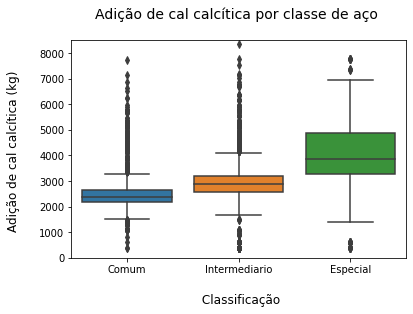

In [ ]:
sns.boxplot(x = 'Classification',y = 'Calcitica (kg) 7071955',data = FEA_1)
plt.ylim([0,8500])
plt.title('Adição de cal calcítica por classe de aço \n',fontsize = 14)
plt.ylabel('Adição de cal calcítica (kg) \n',fontsize = 12)
plt.xlabel('\n Classificação',fontsize=12)
plt.show

<function matplotlib.pyplot.show>

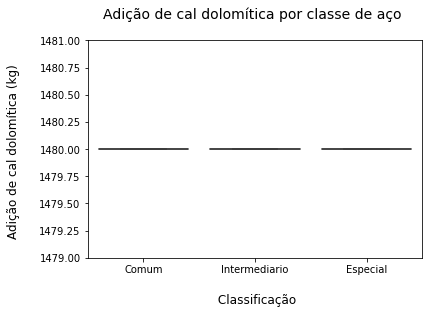

In [ ]:
sns.boxplot(x = 'Classification',y = 'Dolomitica (kg) 7071957',data = FEA_1)
plt.ylim([1479,1481])
plt.title('Adição de cal dolomítica por classe de aço \n',fontsize = 14)
plt.ylabel('Adição de cal dolomítica (kg) \n',fontsize = 12)
plt.xlabel('\n Classificação',fontsize=12)
plt.show

In [ ]:
lista_1 = list(FEA_1['Dolomitica (kg) 7071957'])
lista_unicos = list(FEA_1['Dolomitica (kg) 7071957'].unique())

In [ ]:
dc = {}
aux1 = []
aux2 = []
for elemento in lista_unicos:
   aux1.append(elemento)
   aux2.append(lista_1.count(elemento))
   dc = {'Valor':aux1,'Frequencia':aux2}
df_aux = pd.DataFrame.from_dict(dc)
df_aux.to_csv('Auxiliar_df.csv',index = False)


In [ ]:
np.quantile(FEA_1['Dolomitica (kg) 7071957'],0.75)

1480.0

In [ ]:
FEA_1['Cal_total'] = FEA_1['Calcitica (kg) 7071955']+FEA_1['Dolomitica (kg) 7071957']

In [ ]:
sns.boxplot(x = 'Classification',y = 'Cal_total',data = FEA_1)
plt.ylim([2000,9000])
plt.title('Adição de cal total por classe de aço \n',fontsize = 14)
plt.ylabel('Adição de cal total (kg) \n',fontsize = 12)
plt.xlabel('\n Classificação',fontsize=12)
plt.show


NameError: ignored

Nota-se que que os aços comuns apresentam-se com uma dispersão de valores mais controlada e com um consumo menor de cal. No caso dos aços classificados como intermediários apresentam valores superiores aos aços comuns, e com uma dispersão maior. No caso dos aços especiais, existe uma maior dispersão de valores quando comparados com os demais aços e também um consumo maior, visto que uma parcela significativa dos dados da base de dados se apresenta bem acima dos aços intermediários, e como consequência dos aços especiais.

In [ ]:
acos_comuns = FEA_1[FEA_1['Classification'] == 'Comum']

In [ ]:
acos_intermediarios = FEA_1[FEA_1['Classification'] == 'Intermediario']

In [ ]:
acos_especiais = FEA_1[FEA_1['Classification'] == 'Especial']

In [ ]:
acos_comuns.shape

(2464, 88)

In [ ]:
acos_especiais.shape

(1427, 88)

In [ ]:
acos_intermediarios.shape

(3747, 88)

In [ ]:
round(acos_comuns.shape[0]/FEA_1.shape[0]*100,2)

32.26

In [ ]:
  acos_comuns.reset_index(inplace = True)
  acos_comuns.drop(labels = 'index',axis = 'columns')
  acos_comuns

,index,Corrida SAA,Corrida MES,Aco,Turno,Turma,Data,kg SiO2 esperada /t,kg SiO2 extra /t,Peso Carregado (t/cor),Carregamento Cesto 1,Carregamento Cesto 2,Carregamento Cesto 3,GUSS (t/cor),SHRE (t/cor),Gusa Eqv.,O2 / GUSSEQ,Densidade Teórica [t/m³],Rendimento Teórico %,RM sem Ligas %,RM com Ligas FE/FP %,Número de Carregamentos,TAP to TAP (min/corr),T.F.Ligado (min/corr),Power Off (min/corr),Power Off Bruto (min/corr),Produtividade (t/h),Aço Líquido Vazado (t/cor),Produção de Tarugos (t/corr),Consumo de Energia Elétrica (MWh/cor),Consumo de Energia Elétrica (kWh/t),Potência (MW),%FeO na escória FEA,%SiO2 na escória FEA,%CaO na escória FEA,Basicidade,%FeO na escória BAIA,%SiO2 na escória BAIA,Basicidade BAIA,Peso Escória (kg/t),...,Pé Liquido (t) Corrigido,Coating de Panela,Temperatura de Vazamento Forno (°C),PPM O2 vazamento,Vida de Canal EBT (nº corridas),Vida Miolo (Delta) (nº corridas),Panela,Vida (n° corridas),Corrente A [kA],Corrente B [kA],Corrente C [kA],Consumo de Eletrodo Teórico [kg/t],Consumo de Ponta [kg/t],I²t,Escorificante FEA [kg/t],FeSiMn (kg)\r\n7071931,FeSiMn saco (kg),CaF2 (kg) \r\n4059595,FeSI 75 (kg)\r\n7071923,Coque Correção (kg)\r\n8800075,FeSiMn fino (kg)\r\n7071930,SiC (kg)\r\n28736,CaC2 (kg)\r\n7070998,Grafite BN (kg)\r\n7071938,FeB (kg)\r\n7071926,Coque Bag PPC (kg)\r\n7071997,CaSi (kg)\r\n7071935,CaSi Granulado (kg)\r\n7071936,FeV (kg)\r\n7071932,Alumínio Barra (kg)\r\n28685,FeNb (kg)\r\n7071977,Grafite saquinho (kg)\r\n7072675,Coque verde Injetado (kg)\r\n7071998,FeCr (kg)\r\n7071970,CaF2 saco (kg)\r\n7071924,Calcitica (kg) 7071955,Dolomitica (kg) 7071957,Classification,Cales_total_kg,Cal_total
0,0,48144,B5662,1032,1,D,12/31/2020,"8,10","17,84","125,00","86,70","28,70","9,60","32,50","28,90","46,13","57,36","0,78","89,75","66,11","66,11",3,"45,15","32,58","12,57","12,52","110,22","82,94","82,64","37,65","455,52","68,51","31,66","11,34","22,37","1,97",,,,"1,57",...,,IDEAL,,,432,432,2,120,"50,15","49,17","49,91","0,65","0,65","91,60","45,31",907,,104,0,,,,,,,,,,,,,,,0,,2180,1578,Comum,3758,3758
1,1,48145,B5663,1032,1,D,1/1/2021,"8,02",,"120,30","85,00","25,50","9,80","31,60","28,80","48,92","49,85","0,78","89,99","89,83","89,83",3,"44,50","31,03","13,47","13,37","146,11","108,37","108,07","35,97","332,87","67,77",,,,,,,,,...,"29,25",IDEAL,,,433,433,7,36,"49,01","49,65","49,38","0,47","0,47","95,41","34,35",892,,100,0,,,,,,,,,,,,,,,0,,2141,1582,Comum,3723,3723
2,2,48146,B5664,1032,1,D,1/1/2021,"8,01",,"119,60","86,40","26,10","7,10","31,20","30,10","50,46","52,49","0,78","89,86","90,36","90,36",3,"52,73","32,90","19,83","19,77","123,31","108,37","108,07","38,19","353,35","67,86",,,,,,,,,...,"29,13",IDEAL,,,434,434,6,10,"49,71","49,99","49,13","0,43","0,43","90,47","33,77",905,,101,0,,,,,,,,,,,,,,,0,,2080,1580,Comum,3660,3660
3,3,48147,B5665,1032,1,D,1/1/2021,"8,14","12,75","119,70","87,30","24,10","8,30","32,40","27,40","52,00","51,41","0,77","89,73","92,05","92,05",3,"42,15","32,53","9,62","9,48","157,66","110,75","110,19","37,68","341,92","68,03","26,30","14,99","26,23","1,75",,,,"0,85",...,"28,24",IDEAL,,812,435,435,2,121,"50,19","50,35","50,39","0,53","0,53","92,78","29,42",893,,0,0,,,,,,,,,,,,,,,0,,1680,1578,Comum,3258,3258
4,4,48148,B5666,1032,1,D,1/1/2021,"7,97","12,36","121,90","82,80","25,50","13,60","31,40","27,20","44,66","64,09","0,78","89,89","88,65","88,65",3,"45,80","34,10","11,70","11,70","141,97","108,37","108,07","37,80","349,76","64,87","26,49","15,16","25,89","1,71",,,,"0,82",...,"24,90",IDEAL,,,436,436,7,37,"49,23","49,49","48,17","0,50","0,50","86,15","28,25",909,,0,0,,,,,,,,,,,,,,,0,,1480,1581,Comum,3061,3061
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2459,7510,55652,C3245,1030-D,3,C,12/5/2021,"8,16"

In [ ]:
q1 = np.quantile(acos_comuns['Cal_total'],0.25)
q3 = np.quantile(acos_comuns['Cal_total'],0.75)
Iq = q3-q1
limite_inf = q1-Iq*1.5
limite_sup = q3+Iq*1.5
[limite_inf,limite_sup]

[2911.5, 4907.5]

In [ ]:
q3

4159.0

In [ ]:
acos_comuns_sem_outliers = acos_comuns[acos_comuns['Cal_total'] >= 2911.5]
acos_comuns_sem_outliers = acos_comuns_sem_outliers[acos_comuns_sem_outliers['Cal_total']<=4907.5]
acos_comuns_sem_outliers.reset_index(inplace = True)
acos_comuns_sem_outliers.drop(labels = ['index','level_0'],axis = 'columns',inplace = True)

In [ ]:
acos_comuns_sem_outliers

,Corrida SAA,Corrida MES,Aco,Turno,Turma,Data,kg SiO2 esperada /t,kg SiO2 extra /t,Peso Carregado (t/cor),Carregamento Cesto 1,Carregamento Cesto 2,Carregamento Cesto 3,GUSS (t/cor),SHRE (t/cor),Gusa Eqv.,O2 / GUSSEQ,Densidade Teórica [t/m³],Rendimento Teórico %,RM sem Ligas %,RM com Ligas FE/FP %,Número de Carregamentos,TAP to TAP (min/corr),T.F.Ligado (min/corr),Power Off (min/corr),Power Off Bruto (min/corr),Produtividade (t/h),Aço Líquido Vazado (t/cor),Produção de Tarugos (t/corr),Consumo de Energia Elétrica (MWh/cor),Consumo de Energia Elétrica (kWh/t),Potência (MW),%FeO na escória FEA,%SiO2 na escória FEA,%CaO na escória FEA,Basicidade,%FeO na escória BAIA,%SiO2 na escória BAIA,Basicidade BAIA,Peso Escória (kg/t),Coque Injetado [kg],...,Pé Liquido (t) Corrigido,Coating de Panela,Temperatura de Vazamento Forno (°C),PPM O2 vazamento,Vida de Canal EBT (nº corridas),Vida Miolo (Delta) (nº corridas),Panela,Vida (n° corridas),Corrente A [kA],Corrente B [kA],Corrente C [kA],Consumo de Eletrodo Teórico [kg/t],Consumo de Ponta [kg/t],I²t,Escorificante FEA [kg/t],FeSiMn (kg)\r\n7071931,FeSiMn saco (kg),CaF2 (kg) \r\n4059595,FeSI 75 (kg)\r\n7071923,Coque Correção (kg)\r\n8800075,FeSiMn fino (kg)\r\n7071930,SiC (kg)\r\n28736,CaC2 (kg)\r\n7070998,Grafite BN (kg)\r\n7071938,FeB (kg)\r\n7071926,Coque Bag PPC (kg)\r\n7071997,CaSi (kg)\r\n7071935,CaSi Granulado (kg)\r\n7071936,FeV (kg)\r\n7071932,Alumínio Barra (kg)\r\n28685,FeNb (kg)\r\n7071977,Grafite saquinho (kg)\r\n7072675,Coque verde Injetado (kg)\r\n7071998,FeCr (kg)\r\n7071970,CaF2 saco (kg)\r\n7071924,Calcitica (kg) 7071955,Dolomitica (kg) 7071957,Classification,Cales_total_kg,Cal_total
0,48144,B5662,1032,1,D,12/31/2020,"8,10","17,84","125,00","86,70","28,70","9,60","32,50","28,90","46,13","57,36","0,78","89,75","66,11","66,11",3,"45,15","32,58","12,57","12,52","110,22","82,94","82,64","37,65","455,52","68,51","31,66","11,34","22,37","1,97",,,,"1,57","745,00",...,,IDEAL,,,432,432,2,120,"50,15","49,17","49,91","0,65","0,65","91,60","45,31",907,,104,0,,,,,,,,,,,,,,,0,,2180,1578,Comum,3758,3758
1,48145,B5663,1032,1,D,1/1/2021,"8,02",,"120,30","85,00","25,50","9,80","31,60","28,80","48,92","49,85","0,78","89,99","89,83","89,83",3,"44,50","31,03","13,47","13,37","146,11","108,37","108,07","35,97","332,87","67,77",,,,,,,,,"654,00",...,"29,25",IDEAL,,,433,433,7,36,"49,01","49,65","49,38","0,47","0,47","95,41","34,35",892,,100,0,,,,,,,,,,,,,,,0,,2141,1582,Comum,3723,3723
2,48146,B5664,1032,1,D,1/1/2021,"8,01",,"119,60","86,40","26,10","7,10","31,20","30,10","50,46","52,49","0,78","89,86","90,36","90,36",3,"52,73","32,90","19,83","19,77","123,31","108,37","108,07","38,19","353,35","67,86",,,,,,,,,"830,00",...,"29,13",IDEAL,,,434,434,6,10,"49,71","49,99","49,13","0,43","0,43","90,47","33,77",905,,101,0,,,,,,,,,,,,,,,0,,2080,1580,Comum,3660,3660
3,48147,B5665,1032,1,D,1/1/2021,"8,14","12,75","119,70","87,30","24,10","8,30","32,40","27,40","52,00","51,41","0,77","89,73","92,05","92,05",3,"42,15","32,53","9,62","9,48","157,66","110,75","110,19","37,68","341,92","68,03","26,30","14,99","26,23","1,75",,,,"0,85","783,00",...,"28,24",IDEAL,,812,435,435,2,121,"50,19","50,35","50,39","0,53","0,53","92,78","29,42",893,,0,0,,,,,,,,,,,,,,,0,,1680,1578,Comum,3258,3258
4,48148,B5666,1032,1,D,1/1/2021,"7,97","12,36","121,90","82,80","25,50","13,60","31,40","27,20","44,66","64,09","0,78","89,89","88,65","88,65",3,"45,80","34,10","11,70","11,70","141,97","108,37","108,07","37,80","349,76","64,87","26,49","15,16","25,89","1,71",,,,"0,82","848,00",...,"24,90",IDEAL,,,436,436,7,37,"49,23","49,49","48,17","0,50","0,50","86,15","28,25",909,,0,0,,,,,,,,,,,,,,,0,,1480,1581,Comum,3061,3061
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...


<function matplotlib.pyplot.show>

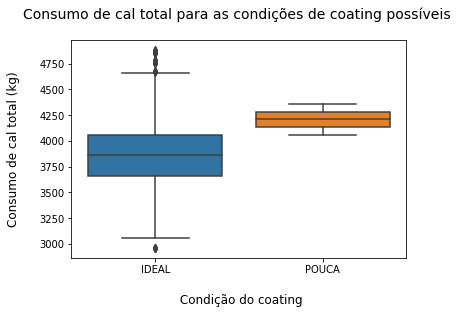

In [ ]:
sns.boxplot(x = 'Coating de Panela', y = 'Cal_total', data = acos_comuns_sem_outliers)
plt.title('Consumo de cal total para as condições de coating possíveis \n',fontsize = 14)
plt.xlabel('\n Condição do coating',fontsize = 12)
plt.ylabel('Consumo de cal total (kg)\n',fontsize = 12)
plt.show

In [ ]:
FEA_1.columns

Index(['Corrida SAA', 'Corrida MES', 'Aco', 'Turno', 'Turma', 'Data',
       'kg SiO2 esperada /t', 'kg SiO2 extra /t', 'Peso Carregado (t/cor)',
       'Carregamento Cesto 1', 'Carregamento Cesto 2', 'Carregamento Cesto 3',
       'GUSS (t/cor)', 'SHRE (t/cor)', 'Gusa Eqv.', 'O2 / GUSSEQ',
       'Densidade Teórica [t/m³]', 'Rendimento Teórico %', 'RM sem Ligas %',
       'RM com Ligas FE/FP %', 'Número de Carregamentos',
       'TAP to TAP (min/corr)', 'T.F.Ligado (min/corr)',
       'Power Off (min/corr)', 'Power Off Bruto (min/corr)',
       'Produtividade (t/h)', 'Aço Líquido Vazado (t/cor)',
       'Produção de Tarugos (t/corr)', 'Consumo de Energia Elétrica (MWh/cor)',
       'Consumo de Energia Elétrica (kWh/t)', 'Potência (MW)',
       '%FeO na escória FEA', '%SiO2 na escória FEA', '%CaO na escória FEA',
       'Basicidade', '%FeO na escória BAIA', '%SiO2 na escória BAIA',
       'Basicidade BAIA', 'Peso Escória (kg/t)', 'Coque Injetado [kg]',
       'Oxigênio (Nm³)', 'Oxigêni

In [ ]:
Atributos = ['kg SiO2 esperada /t', 'kg SiO2 extra /t', 'Peso Carregado (t/cor)',
       'Carregamento Cesto 1', 'Carregamento Cesto 2', 'Carregamento Cesto 3',
       'GUSS (t/cor)', 'SHRE (t/cor)', 'Gusa Eqv.', 'O2 / GUSSEQ',
       'Densidade Teórica [t/m³]', 'Rendimento Teórico %', 'RM sem Ligas %',
       'RM com Ligas FE/FP %', 'Número de Carregamentos',
       'TAP to TAP (min/corr)', 'T.F.Ligado (min/corr)',
       'Power Off (min/corr)', 'Power Off Bruto (min/corr)',
       'Produtividade (t/h)', 'Aço Líquido Vazado (t/cor)',
       'Produção de Tarugos (t/corr)', 'Consumo de Energia Elétrica (MWh/cor)',
       'Consumo de Energia Elétrica (kWh/t)', 'Potência (MW)',
       '%FeO na escória FEA', '%SiO2 na escória FEA', '%CaO na escória FEA',
       'Basicidade', '%FeO na escória BAIA', '%SiO2 na escória BAIA',
       'Basicidade BAIA', 'Peso Escória (kg/t)', 'Oxigênio FEA (m³/t)', 
       'Oxigênio PC (Nm³)',  'Gás Natural (Nm³)',
       'Gás Natural (m³/t)', 'Pé Liquido (t) Estimado',
       'Pé Liquido (t) Corrigido', 'PPM O2 vazamento',
       'Vida de Canal EBT (nº corridas)', 'Vida Miolo (Delta) (nº corridas)',
       'Panela', 'Vida (n° corridas)', 'Corrente A [kA]', 'Corrente B [kA]',
       'Corrente C [kA]', 'Consumo de Eletrodo Teórico [kg/t]',
       'Consumo de Ponta [kg/t]', 'I²t', 'Escorificante FEA [kg/t]',
       'FeSiMn (kg)\r\n7071931', 'FeSiMn saco (kg)', 'CaF2 (kg) \r\n4059595',
       'FeSI 75 (kg)\r\n7071923', 'Coque Correção (kg)\r\n8800075',
       'FeSiMn fino (kg)\r\n7071930', 'SiC (kg)\r\n28736',
       'CaC2  (kg)\r\n7070998', 'Grafite BN (kg)\r\n7071938',
       'FeB (kg)\r\n7071926', 'Coque Bag PPC (kg)\r\n7071997',
       'CaSi (kg)\r\n7071935', 'CaSi Granulado (kg)\r\n7071936',
       'FeV (kg)\r\n7071932', 'Alumínio Barra (kg)\r\n28685',
       'FeNb (kg)\r\n7071977 ', 'Grafite saquinho (kg)\r\n7072675',
       'Coque verde Injetado (kg)\r\n7071998', 'FeCr (kg)\r\n7071970',
       'CaF2 saco (kg)\r\n7071924']

In [ ]:
for atributo in Atributos:
  virgula_ponto(acos_comuns_sem_outliers[atributo])
  remove_espaci(acos_comuns_sem_outliers[atributo])
  remove_parentese(acos_comuns_sem_outliers[atributo])
  converte_para_numero(acos_comuns_sem_outliers[atributo])


In [ ]:
acos_comuns_sem_outliers[ Atributos[35]].unique()

array([356.0, 320.0, 337.0, 277.0, 310.0, 334.0, 220.0, 227.0, 357.0,
       346.0, 301.0, 399.0, 433.0, 444.0, 393.0, 584.0, 540.0, 401.0,
       463.0, 367.0, 394.0, 312.0, 330.0, 338.0, 470.0, 291.0, 297.0,
       290.0, 262.0, 331.0, 404.0, 296.0, 304.0, 303.0, 395.0, 443.0,
       342.0, 349.0, 366.0, 317.0, 181.0, 307.0, 247.0, 288.0, 355.0,
       209.0, 253.0, 193.0, 259.0, 248.0, 261.0, 254.0, 242.0, 246.0,
       249.0, 348.0, 245.0, 458.0, 527.0, 466.0, 523.0, 479.0, 431.0,
       294.0, 308.0, 295.0, 464.0, 318.0, 260.0, 306.0, 271.0, 407.0,
       285.0, 281.0, 272.0, 299.0, 286.0, 302.0, 237.0, 298.0, 293.0,
       344.0, 314.0, 476.0, 533.0, 626.0, 279.0, 287.0, 268.0, 319.0,
       322.0, 300.0, 360.0, 278.0, 832.0, 206.0, 223.0, 264.0, 270.0,
       353.0, 722.0, 276.0, 389.0, 266.0, 267.0, 113.0, 439.0, 382.0,
       370.0, 323.0, 332.0, 341.0, 335.0, 340.0, 345.0, 333.0, 354.0,
       532.0, 611.0, 305.0, 351.0, 216.0, 326.0, 232.0, 178.0, 315.0,
       329.0, 516.0,

In [ ]:
Atributos[35]

'Gás Natural (Nm³)'

In [ ]:
Atributos_2 = ['Coque Injetado [kg]','Temperatura de Vazamento Forno (°C)','Oxigênio (Nm³)','Oxigênio Lança (Nm³)','Oxigênio Queima (Nm³)']

In [ ]:

for atributo in Atributos_2:
  converte_para_numero2(acos_comuns_sem_outliers[atributo])

In [ ]:
atributos_float = Atributos_2+Atributos

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matp

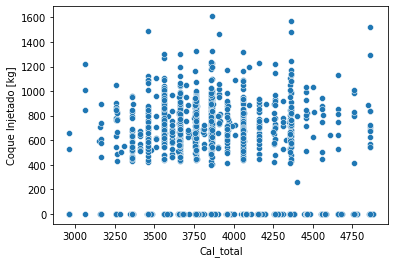

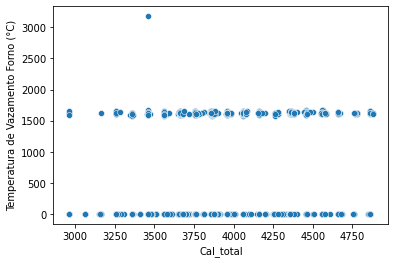

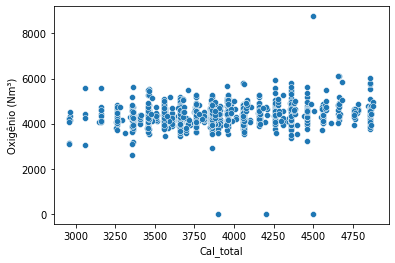

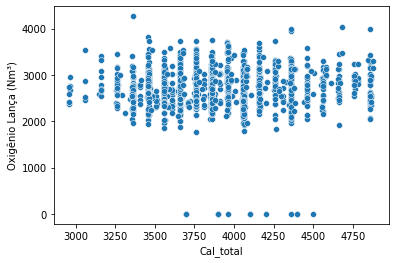

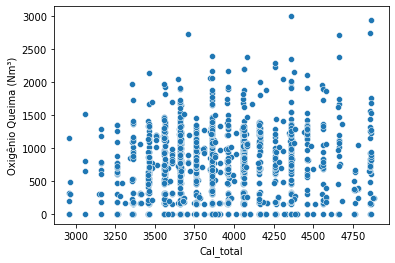

...

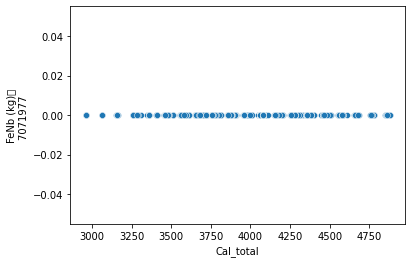

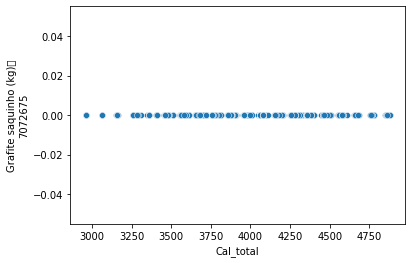

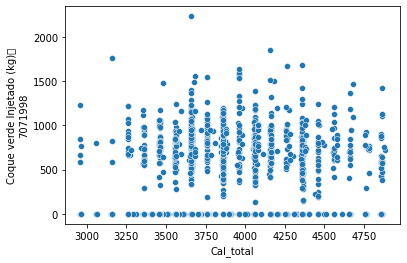

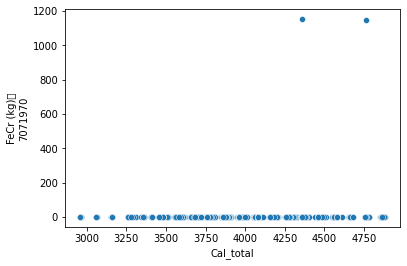

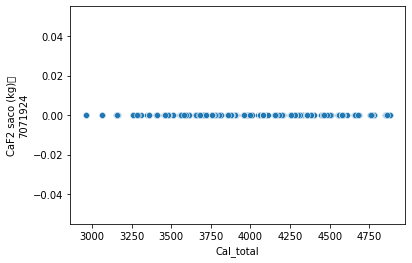

In [ ]:
aux = []
for atributo in atributos_float:
  fig = plt.figure()
  fig = sns.scatterplot(x = 'Cal_total', y = atributo,data = acos_comuns_sem_outliers)
  aux.append(fig)

In [ ]:
acos_comuns_sem_outliers_2 = acos_comuns_sem_outliers.drop(['CaF2 saco (kg)\r\n7071924','Alumínio Barra (kg)\r\n28685','FeCr (kg)\r\n7071970','FeNb (kg)\r\n7071977 ','Grafite saquinho (kg)\r\n7072675',
                                                            'FeV (kg)\r\n7071932','CaSi Granulado (kg)\r\n7071936','CaSi (kg)\r\n7071935','Coque Bag PPC (kg)\r\n7071997','CaF2 (kg) \r\n4059595',
                                                            'CaC2  (kg)\r\n7070998','SiC (kg)\r\n28736','FeSiMn fino (kg)\r\n7071930','Coque Correção (kg)\r\n8800075','Oxigênio PC (Nm³)','FeB (kg)\r\n7071926',
                                                            'Grafite BN (kg)\r\n7071938','FeSiMn saco (kg)'],axis = 'columns')

In [ ]:
lista_aux = []
for atributo in acos_comuns_sem_outliers.columns:
  lista_aux.append(e_nulo(acos_comuns_sem_outliers[atributo]))


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matp

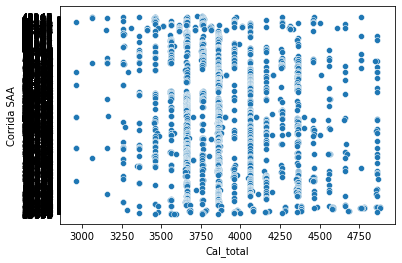

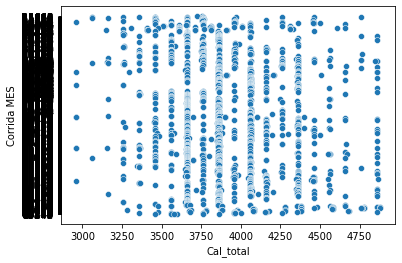

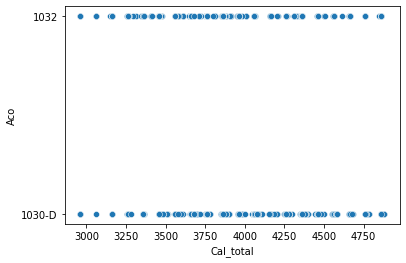

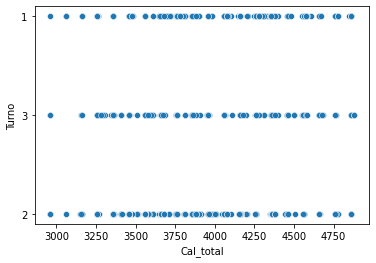

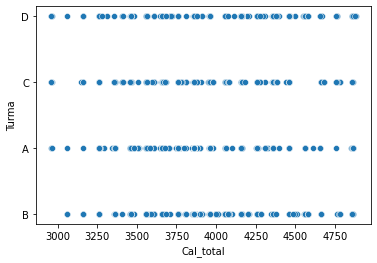

...

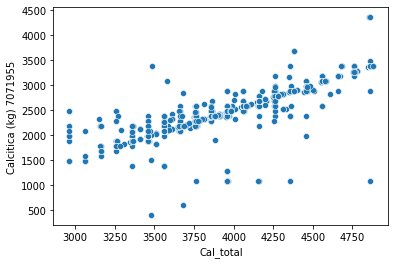

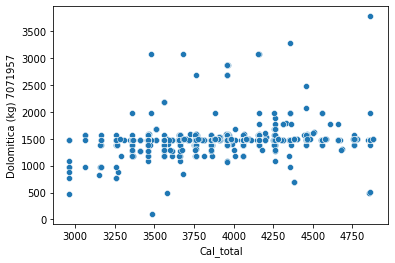

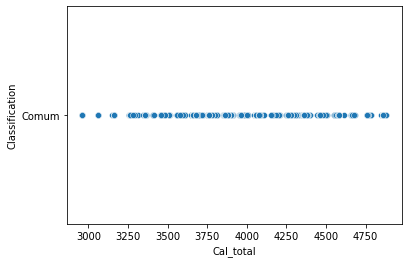

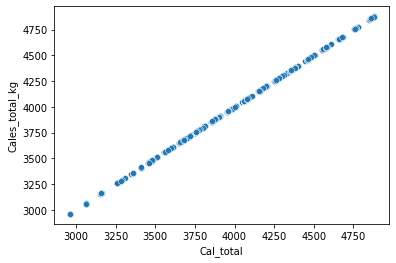

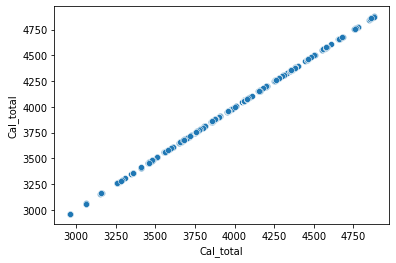

In [ ]:
aux = []
for atributo in acos_comuns_sem_outliers_2.columns:
  fig = plt.figure()
  fig = sns.scatterplot(x = 'Cal_total', y = atributo,data = acos_comuns_sem_outliers)
  aux.append(fig)

(0.0, 50.0)

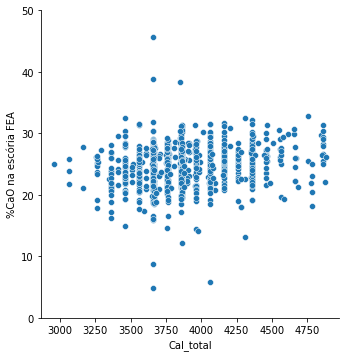

In [ ]:
sns.relplot(x = 'Cal_total', y = '%CaO na escória FEA',data = acos_comuns_sem_outliers[lista_aux[33]])
plt.ylim([0,50])

In [ ]:
colunas = {}
for i in range(len(acos_comuns_sem_outliers.columns)):
  colunas[i] = acos_comuns_sem_outliers.columns[i]

In [ ]:
colunas

{0: 'Corrida SAA',
 1: 'Corrida MES',
 2: 'Aco',
 3: 'Turno',
 4: 'Turma',
 5: 'Data',
 6: 'kg SiO2 esperada /t',
 7: 'kg SiO2 extra /t',
 8: 'Peso Carregado (t/cor)',
 9: 'Carregamento Cesto 1',
 10: 'Carregamento Cesto 2',
 11: 'Carregamento Cesto 3',
 12: 'GUSS (t/cor)',
 13: 'SHRE (t/cor)',
 14: 'Gusa Eqv.',
 15: 'O2 / GUSSEQ',
 16: 'Densidade Teórica [t/m³]',
 17: 'Rendimento Teórico %',
 18: 'RM sem Ligas %',
 19: 'RM com Ligas FE/FP %',
 20: 'Número de Carregamentos',
 21: 'TAP to TAP (min/corr)',
 22: 'T.F.Ligado (min/corr)',
 23: 'Power Off (min/corr)',
 24: 'Power Off Bruto (min/corr)',
 25: 'Produtividade (t/h)',
 26: 'Aço Líquido Vazado (t/cor)',
 27: 'Produção de Tarugos (t/corr)',
 28: 'Consumo de Energia Elétrica (MWh/cor)',
 29: 'Consumo de Energia Elétrica (kWh/t)',
 30: 'Potência (MW)',
 31: '%FeO na escória FEA',
 32: '%SiO2 na escória FEA',
 33: '%CaO na escória FEA',
 34: 'Basicidade',
 35: '%FeO na escória BAIA',
 36: '%SiO2 na escória BAIA',
 37: 'Basicidade BAIA

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

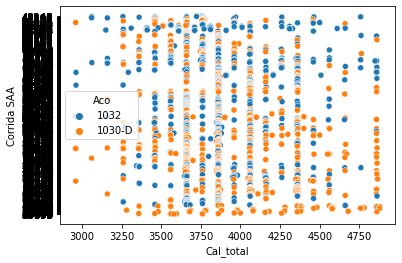

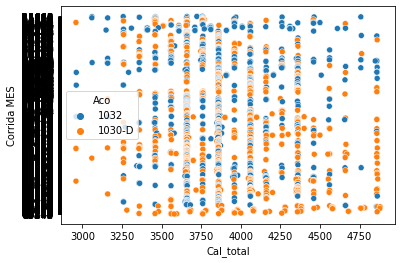

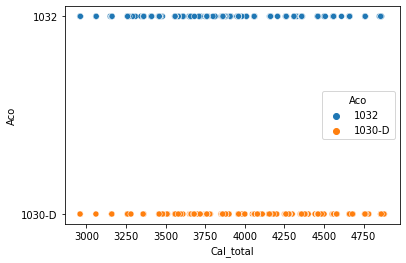

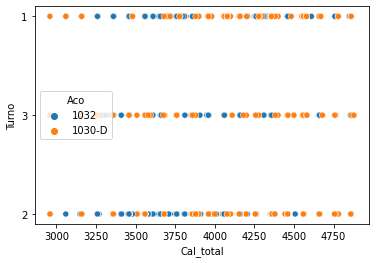

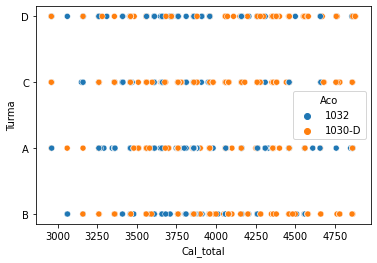

...

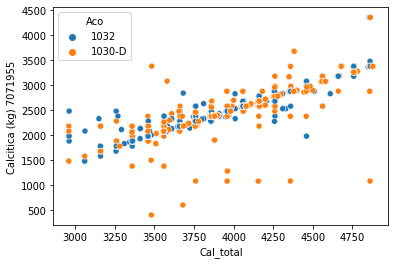

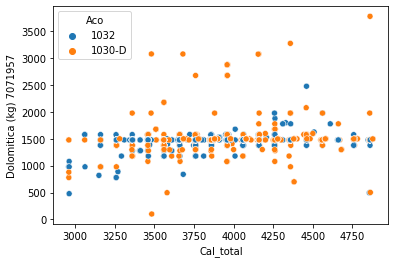

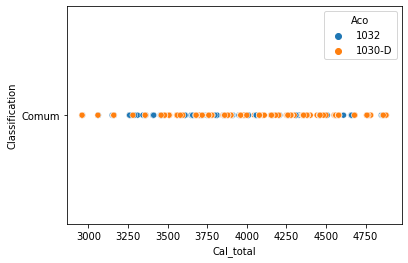

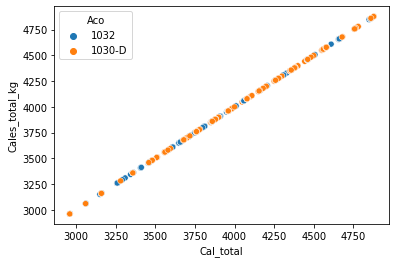

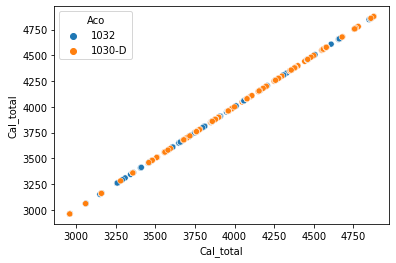

In [ ]:
for i in range(acos_comuns_sem_outliers.shape[1]):
  fig = plt.figure()
  fig = sns.scatterplot(x = 'Cal_total', y = colunas[i],data = acos_comuns_sem_outliers[lista_aux[i]],hue = 'Aco')
  aux.append(fig)


In [ ]:
import statsmodels.api as sm

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [ ]:
lista  = []
cal_total_lista = []
for coluna in acos_comuns_sem_outliers.columns:
    aux = []
    aux2 = []
    for i in range(acos_comuns_sem_outliers.shape[0]):
      if acos_comuns_sem_outliers[coluna].values[i] == 0:
        continue
      aux2.append((acos_comuns_sem_outliers['Cal_total'].values[i]))
      aux.append(acos_comuns_sem_outliers[coluna].values[i])
    lista.append(aux)
    cal_total_lista.append(aux2)


In [ ]:

for i in range(6,len(lista)):
  if cal_total_lista[i] == []:
    continue
  if i == 49 or i==85:
    continue
  X = cal_total_lista[i]
  X = np.array(X)
  X = X.astype(float)
  X = sm.add_constant(X)
  Y = lista[i]
  Y = np.array(Y)
  Y = Y.astype(float)
  print('x = '+ colunas[i]+'y = '+ colunas[87])
  modelo = sm.OLS(Y,X)
  resultado = modelo.fit()
  print(resultado.summary())

x = kg SiO2 esperada /ty = Cal_total
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.044
Model:                            OLS   Adj. R-squared:                  0.044
Method:                 Least Squares   F-statistic:                     104.9
Date:                Mon, 17 Jan 2022   Prob (F-statistic):           4.16e-24
Time:                        13:10:40   Log-Likelihood:                -833.49
No. Observations:                2279   AIC:                             1671.
Df Residuals:                    2277   BIC:                             1682.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          

/usr/local/lib/python3.7/dist-packages/statsmodels/stats/stattools.py:71: ValueWarning: omni_normtest is not valid with less than 8 observations; 2 samples were given.
  "samples were given." % int(n), ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/regression/linear_model.py:1648: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - (np.divide(self.nobs - self.k_constant, self.df_resid)
/usr/local/lib/python3.7/dist-packages/statsmodels/regression/linear_model.py:1649: RuntimeWarning: invalid value encountered in double_scalars
  * (1 - self.rsquared))
/usr/local/lib/python3.7/dist-packages/statsmodels/regression/linear_model.py:1665: RuntimeWarning: divide by zero encountered in double_scalars
  return self.ssr/self.df_resid
/usr/local/lib/python3.7/dist-packages/statsmodels/regression/linear_model.py:1578: RuntimeWarning: divide by zero encountered in double_scalars
  return np.dot(wresid, wresid) / self.df_resid


In [ ]:
colunas

{0: 'Corrida SAA',
 1: 'Corrida MES',
 2: 'Aco',
 3: 'Turno',
 4: 'Turma',
 5: 'Data',
 6: 'kg SiO2 esperada /t',
 7: 'kg SiO2 extra /t',
 8: 'Peso Carregado (t/cor)',
 9: 'Carregamento Cesto 1',
 10: 'Carregamento Cesto 2',
 11: 'Carregamento Cesto 3',
 12: 'GUSS (t/cor)',
 13: 'SHRE (t/cor)',
 14: 'Gusa Eqv.',
 15: 'O2 / GUSSEQ',
 16: 'Densidade Teórica [t/m³]',
 17: 'Rendimento Teórico %',
 18: 'RM sem Ligas %',
 19: 'RM com Ligas FE/FP %',
 20: 'Número de Carregamentos',
 21: 'TAP to TAP (min/corr)',
 22: 'T.F.Ligado (min/corr)',
 23: 'Power Off (min/corr)',
 24: 'Power Off Bruto (min/corr)',
 25: 'Produtividade (t/h)',
 26: 'Aço Líquido Vazado (t/cor)',
 27: 'Produção de Tarugos (t/corr)',
 28: 'Consumo de Energia Elétrica (MWh/cor)',
 29: 'Consumo de Energia Elétrica (kWh/t)',
 30: 'Potência (MW)',
 31: '%FeO na escória FEA',
 32: '%SiO2 na escória FEA',
 33: '%CaO na escória FEA',
 34: 'Basicidade',
 35: '%FeO na escória BAIA',
 36: '%SiO2 na escória BAIA',
 37: 'Basicidade BAIA

In [ ]:
cal_total_lista[82]

[]

In [ ]:
colunas

{0: 'Corrida SAA',
 1: 'Corrida MES',
 2: 'Aco',
 3: 'Turno',
 4: 'Turma',
 5: 'Data',
 6: 'kg SiO2 esperada /t',
 7: 'kg SiO2 extra /t',
 8: 'Peso Carregado (t/cor)',
 9: 'Carregamento Cesto 1',
 10: 'Carregamento Cesto 2',
 11: 'Carregamento Cesto 3',
 12: 'GUSS (t/cor)',
 13: 'SHRE (t/cor)',
 14: 'Gusa Eqv.',
 15: 'O2 / GUSSEQ',
 16: 'Densidade Teórica [t/m³]',
 17: 'Rendimento Teórico %',
 18: 'RM sem Ligas %',
 19: 'RM com Ligas FE/FP %',
 20: 'Número de Carregamentos',
 21: 'TAP to TAP (min/corr)',
 22: 'T.F.Ligado (min/corr)',
 23: 'Power Off (min/corr)',
 24: 'Power Off Bruto (min/corr)',
 25: 'Produtividade (t/h)',
 26: 'Aço Líquido Vazado (t/cor)',
 27: 'Produção de Tarugos (t/corr)',
 28: 'Consumo de Energia Elétrica (MWh/cor)',
 29: 'Consumo de Energia Elétrica (kWh/t)',
 30: 'Potência (MW)',
 31: '%FeO na escória FEA',
 32: '%SiO2 na escória FEA',
 33: '%CaO na escória FEA',
 34: 'Basicidade',
 35: '%FeO na escória BAIA',
 36: '%SiO2 na escória BAIA',
 37: 'Basicidade BAIA

Text(0, 0.5, ' Consumo de Escorificante (kg/t) \n')

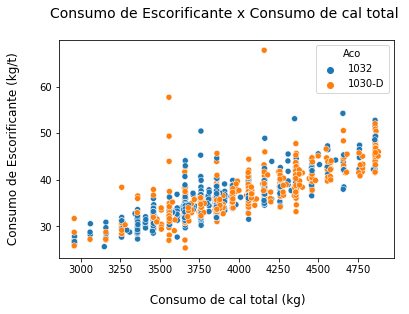

In [ ]:
fig = plt.figure()
fig = sns.scatterplot(x = 'Cal_total', y = colunas[62],data = acos_comuns_sem_outliers[lista_aux[62]],hue = 'Aco')
plt.title("Consumo de Escorificante x Consumo de cal total \n",fontsize = 14)
plt.xlabel("\n Consumo de cal total (kg)",fontsize = 12)
plt.ylabel(" Consumo de Escorificante (kg/t) \n",fontsize = 12)

# Análise de dados escória

In [ ]:
worksheet = gc.open('Composição Quimica de Escória').sheet1
rows = worksheet.get_all_values()
escoria = pd.DataFrame(rows)
escoria.shape

(4265, 18)

In [ ]:
escoria.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
0,Consulta de Composição Química - Escória,,,,,,,,,,,,,,,,,
1,Mês,Data,Corrida,Grau Aço,S,Al2O3,BAS,CaO,Cr2O3,F,FeO,MgO,MnO,P2O5,RESIDUAL,SiO2,TOTAL,TiO2
2,1,01/01/2021,B5662,1032,"0,051","3,951","1,9726","22,367","2,237","1,614","31,66","6,968","8,586","0,936","9,2781","11,339",100,"1,013"
3,1,01/01/2021,B5665,1032,"0,052","5,374","1,7507","26,233","2,095","1,27","26,297","7,67","9,189","1,251","4,3776","14,985",100,"1,207"
4,1,01/01/2021,B5666,1032,"0,049","5,355","1,7077","25,891","2,196","1,334","26,494","7,898","9,338","1,277","3,7241","15,161",100,"1,283"


In [ ]:
escoria[:][1:2].values

array([['Mês', 'Data', 'Corrida', 'Grau Aço', 'S', 'Al2O3', 'BAS', 'CaO',
        'Cr2O3', 'F', 'FeO', 'MgO', 'MnO', 'P2O5', 'RESIDUAL', 'SiO2',
        'TOTAL', 'TiO2']], dtype=object)

In [ ]:
lista_colunas_escoria = ['Mês', 'Data', 'Corrida', 'Grau Aço', 'S', 'Al2O3', 'BAS', 'CaO',
        'Cr2O3', 'F', 'FeO', 'MgO', 'MnO', 'P2O5', 'RESIDUAL', 'SiO2',
        'TOTAL', 'TiO2']

In [ ]:
len(lista_colunas_escoria)
#escoria.shape[1]

18

In [ ]:
aux_dc = {}
for i in range(len(lista_colunas_escoria)):
  aux_dc[i] = lista_colunas_escoria[i]

In [ ]:
escoria.rename(aux_dc,axis = 'columns',inplace = True)
escoria.drop([0,1],inplace = True)
escoria.set_axis(range(escoria.shape[0]),axis = 'index',inplace = True)

In [ ]:
 escoria['Classification'] = ''
for i in range(escoria.shape[0]):
  if escoria['Grau Aço'][i] in acos:
    escoria['Classification'][i] = acos[escoria['Grau Aço'][i]]



In [ ]:
escoria

,Mês,Data,Corrida,Grau Aço,S,Al2O3,BAS,CaO,Cr2O3,F,FeO,MgO,MnO,P2O5,RESIDUAL,SiO2,TOTAL,TiO2,Classification
0,1,01/01/2021,B5662,1032,"0,051","3,951","1,9726","22,367","2,237","1,614","31,66","6,968","8,586","0,936","9,2781","11,339",100,"1,013",Comum
1,1,01/01/2021,B5665,1032,"0,052","5,374","1,7507","26,233","2,095","1,27","26,297","7,67","9,189","1,251","4,3776","14,985",100,"1,207",Comum
2,1,01/01/2021,B5666,1032,"0,049","5,355","1,7077","25,891","2,196","1,334","26,494","7,898","9,338","1,277","3,7241","15,161",100,"1,283",Comum
3,1,01/01/2021,B5667,1032,"0,041","5,033","1,7048","25,599","2,369","1,003","25,666","7,981","9,21","1,188","5,6687","15,016",100,"1,225",Comum
4,1,01/01/2021,B5668,ABNT1012,"0,043","5,764","1,5423","25,284","2,025","1,141","26,55","8,128","9,127","0,858","3,3397","16,393",100,"1,348",Intermediario
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4258,12,11/12/2021,C3360,10B06,"0,123",3,"2,469","26,337","1,856","0,657","34,951","5,709","6,216","1,297","16,114","10,667",100,"0,791",Especial
4259,12,11/12/2021,C3361,10B06,"0,126","3,053","2,5081","26,754","1,936","0,493","35,519","5,741","6,144","1,418","15,2168","10,667",100,"0,779",Especial
4260,12,11/12/2021,C3362,10B06,"0,119","2,783","2,6465","23,94","1,927","0,644","37,358","6,615","5,856","1,166","18,0608","9,046",100,"0,737",Especial
4261,12,11/12/2021,C3363,10B06,"0,102","3,137","2,1297","25,422","1,941","0,538","35,31","5,645","6,12","1,395","15,3927","11,937",100,"0,86",Especial


In [ ]:
dc_corrida_turma = {}
dc_corrida_cal_total = {}
dc_corrida_acov_total = {}
dc_corrida_energia = {}
dc_corrida_cal = {}
dc_corrida_dol = {}
dc_corrida_o2 = {}
dc_corrida_tfl = {}
dc_corrida_pot = {}
dc_corrida_coat = {}
for i in range(FEA_1.shape[0]):
  dc_corrida_turma[FEA_1['Corrida MES'][i]] = FEA_1['Turma'][i]
  dc_corrida_cal_total[FEA_1['Corrida MES'][i]] = FEA_1['Cal_total'][i]
  dc_corrida_acov_total[FEA_1['Corrida MES'][i]] = FEA_1['Aço Líquido Vazado (t/cor)'][i]
  dc_corrida_energia[FEA_1['Corrida MES'][i]] = FEA_1['Consumo de Energia Elétrica (kWh/t)'][i]
  dc_corrida_cal[FEA_1['Corrida MES'][i]] = FEA_1['Calcitica (kg) 7071955'][i]
  dc_corrida_dol[FEA_1['Corrida MES'][i]] = FEA_1['Dolomitica (kg) 7071957'][i]
  dc_corrida_o2[FEA_1['Corrida MES'][i]] = FEA_1['PPM O2 vazamento'][i]
  dc_corrida_tfl[FEA_1['Corrida MES'][i]] = FEA_1['T.F.Ligado (min/corr)'][i]
  dc_corrida_pot[FEA_1['Corrida MES'][i]] = FEA_1['Potência (MW)'][i]
  dc_corrida_coat[FEA_1['Corrida MES'][i]] = FEA_1['Coating de Panela'][i]    

   

In [ ]:
escoria['Turma'] = ''
escoria['Cal_total'] = ''
escoria['aco_vazado_t'] = ''
escoria['energia_kwh/t'] = ''
escoria['calcitica_kg'] = ''
escoria['dolomitica_kg'] = ''
escoria['o2_ppm'] = ''
escoria['tempo_forno_ligado_minutos'] =''
escoria['potencia_MW'] = ''
escoria['coating'] = ''
for i in range(escoria.shape[0]):
  if escoria['Corrida'][i] in [FEA_1['Corrida MES'][k] for k in range(FEA_1.shape[0])]:
    escoria['Turma'][i] = dc_corrida_turma[escoria['Corrida'][i]]
    escoria['Cal_total'][i] = dc_corrida_cal_total[escoria['Corrida'][i]]
    escoria['aco_vazado_t'][i] = dc_corrida_acov_total[escoria['Corrida'][i]]
    escoria['energia_kwh/t'][i] = dc_corrida_energia[escoria['Corrida'][i]]
    escoria['calcitica_kg'][i] = dc_corrida_cal[escoria['Corrida'][i]]
    escoria['dolomitica_kg'][i] = dc_corrida_dol[escoria['Corrida'][i]]
    escoria['o2_ppm'][i] = dc_corrida_o2[escoria['Corrida'][i]]
    escoria['tempo_forno_ligado_minutos'][i] = dc_corrida_tfl[escoria['Corrida'][i]]
    escoria['potencia_MW'][i] = dc_corrida_pot[escoria['Corrida'][i]]
    escoria['coating'][i] = dc_corrida_coat[escoria['Corrida'][i]]

    
                               

In [ ]:
escoria

,Mês,Data,Corrida,Grau Aço,S,Al2O3,BAS,CaO,Cr2O3,F,FeO,MgO,MnO,P2O5,RESIDUAL,SiO2,TOTAL,TiO2,Classification,Turma,Cal_total,aco_vazado_t,energia_kwh/t,calcitica_kg,dolomitica_kg,o2_ppm,tempo_forno_ligado_minutos,potencia_MW,coating
0,1,01/01/2021,B5662,1032,"0,051","3,951","1,9726","22,367","2,237","1,614","31,66","6,968","8,586","0,936","9,2781","11,339",100,"1,013",Comum,D,3758,"82,94","455,52",2180,1578,,"32,58","68,51",IDEAL
1,1,01/01/2021,B5665,1032,"0,052","5,374","1,7507","26,233","2,095","1,27","26,297","7,67","9,189","1,251","4,3776","14,985",100,"1,207",Comum,D,3258,"110,75","341,92",1680,1578,812,"32,53","68,03",IDEAL
2,1,01/01/2021,B5666,1032,"0,049","5,355","1,7077","25,891","2,196","1,334","26,494","7,898","9,338","1,277","3,7241","15,161",100,"1,283",Comum,D,3061,"108,37","349,76",1480,1581,,"34,10","64,87",IDEAL
3,1,01/01/2021,B5667,1032,"0,041","5,033","1,7048","25,599","2,369","1,003","25,666","7,981","9,21","1,188","5,6687","15,016",100,"1,225",Comum,D,3461,"110,49","343,13",1880,1581,,"32,73","67,54",IDEAL
4,1,01/01/2021,B5668,ABNT1012,"0,043","5,764","1,5423","25,284","2,025","1,141","26,55","8,128","9,127","0,858","3,3397","16,393",100,"1,348",Intermediario,D,3260,"125,09","292,53",1680,1580,,"33,02","66,33",IDEAL
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4258,12,11/12/2021,C3360,10B06,"0,123",3,"2,469","26,337","1,856","0,657","34,951","5,709","6,216","1,297","16,114","10,667",100,"0,791",Especial,B,4586,"106,25","380,56",3283,1303,,"35,63","67,74",IDEAL
4259,12,11/12/2021,C3361,10B06,"0,126","3,053","2,5081","26,754","1,936","0,493","35,519","5,741","6,144","1,418","15,2168","10,667",100,"0,779",Especial,B,4578,"114,73","346,69",3279,1299,,"35,53","67,31",IDEAL
4260,12,11/12/2021,C3362,10B06,"0,119","2,783","2,6465","23,94","1,927","0,644","37,358","6,615","5,856","1,166","18,0608","9,046",100,"0,737",Especial,B,4582,"106,25","369,70",3281,1301,,"35,73","65,98",IDEAL
4261,12,11/12/2021,C3363,10B06,"0,102","3,137","2,1297","25,422","1,941","0,538","35,31","5,645","6,12","1,395","15,3927","11,937",100,"0,86",Especial,C,4577,"102,01","386,09",3278,1299,645,"35,25","66,99",IDEAL


In [ ]:
lista_colunas_escoria = []
for i in range(escoria.shape[1]):
  lista_colunas_escoria.append(escoria.columns.values[i])

In [ ]:
for atributo in [ 'S', 'Al2O3', 'BAS', 'CaO',   'Cr2O3', 'F', 'FeO', 'MgO', 'MnO', 'P2O5', 'RESIDUAL', 'SiO2', 'TOTAL',
       'TiO2',  'aco_vazado_t',       'energia_kwh/t', 'o2_ppm',       'tempo_forno_ligado_minutos', 'potencia_MW']:
  virgula_ponto(escoria[atributo])
  remove_espaci(escoria[atributo])
  remove_parentese(escoria[atributo])
  converte_para_numero(escoria[atributo])


In [ ]:
escoria

,Mês,Data,Corrida,Grau Aço,S,Al2O3,BAS,CaO,Cr2O3,F,FeO,MgO,MnO,P2O5,RESIDUAL,SiO2,TOTAL,TiO2,Classification,Turma,Cal_total,aco_vazado_t,energia_kwh/t,calcitica_kg,dolomitica_kg,o2_ppm,tempo_forno_ligado_minutos,potencia_MW,coating
0,1,01/01/2021,B5662,1032,0.051,3.951,1.9726,22.367,2.237,1.614,31.66,6.968,8.586,0.936,9.2781,11.339,100,1.013,Comum,D,3758,82.94,455.52,2180,1578,0,32.58,68.51,IDEAL
1,1,01/01/2021,B5665,1032,0.052,5.374,1.7507,26.233,2.095,1.27,26.297,7.67,9.189,1.251,4.3776,14.985,100,1.207,Comum,D,3258,110.75,341.92,1680,1578,812,32.53,68.03,IDEAL
2,1,01/01/2021,B5666,1032,0.049,5.355,1.7077,25.891,2.196,1.334,26.494,7.898,9.338,1.277,3.7241,15.161,100,1.283,Comum,D,3061,108.37,349.76,1480,1581,0,34.1,64.87,IDEAL
3,1,01/01/2021,B5667,1032,0.041,5.033,1.7048,25.599,2.369,1.003,25.666,7.981,9.21,1.188,5.6687,15.016,100,1.225,Comum,D,3461,110.49,343.13,1880,1581,0,32.73,67.54,IDEAL
4,1,01/01/2021,B5668,ABNT1012,0.043,5.764,1.5423,25.284,2.025,1.141,26.55,8.128,9.127,0.858,3.3397,16.393,100,1.348,Intermediario,D,3260,125.09,292.53,1680,1580,0,33.02,66.33,IDEAL
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4258,12,11/12/2021,C3360,10B06,0.123,3,2.469,26.337,1.856,0.657,34.951,5.709,6.216,1.297,16.114,10.667,100,0.791,Especial,B,4586,106.25,380.56,3283,1303,0,35.63,67.74,IDEAL
4259,12,11/12/2021,C3361,10B06,0.126,3.053,2.5081,26.754,1.936,0.493,35.519,5.741,6.144,1.418,15.2168,10.667,100,0.779,Especial,B,4578,114.73,346.69,3279,1299,0,35.53,67.31,IDEAL
4260,12,11/12/2021,C3362,10B06,0.119,2.783,2.6465,23.94,1.927,0.644,37.358,6.615,5.856,1.166,18.0608,9.046,100,0.737,Especial,B,4582,106.25,369.7,3281,1301,0,35.73,65.98,IDEAL
4261,12,11/12/2021,C3363,10B06,0.102,3.137,2.1297,25.422,1.941,0.538,35.31,5.645,6.12,1.395,15.3927,11.937,100,0.86,Especial,C,4577,102.01,386.09,3278,1299,645,35.25,66.99,IDEAL


In [ ]:
aux = []
for i in range(escoria.shape[0]):
  a = escoria['Cal_total'][i]
  aux.append(a) 

In [ ]:
aux2 = []
for i in range(len(aux)):
  if aux[i]=="":
    aux[i] = 0.0
  a = float(aux[i])
  aux2.append(a)


In [ ]:
escoria['Cal_total'] = aux2

In [ ]:
aux = []
for i in range(escoria.shape[0]):
  a = escoria['calcitica_kg'][i]
  aux.append(a)
aux2 = []
for i in range(len(aux)):
  if aux[i]=="":
    aux[i] = 0.0
  a = float(aux[i])
  aux2.append(a)
escoria['calcitica_kg'] = aux2

In [ ]:
aux = []
for i in range(escoria.shape[0]):
  a = escoria['dolomitica_kg'][i]
  aux.append(a)
aux2 = []
for i in range(len(aux)):
  if aux[i]=="":
    aux[i] = 0.0
  a = float(aux[i])
  aux2.append(a)
escoria['dolomitica_kg'] = aux2

In [ ]:
aux = []
for i in range(escoria.shape[0]):
  a = escoria['S'][i]
  aux.append(a)
aux2 = []
for i in range(len(aux)):
  if aux[i]=="":
      aux[i] = 0.0
  a = float(aux[i])
  aux2.append(a)
escoria['S'] = aux2

In [ ]:
aux = []
for i in range(escoria.shape[0]):
  a = escoria['Al2O3'][i]
  aux.append(a)
aux2 = []
for i in range(len(aux)):
  if aux[i]=="":
      aux[i] = 0.0
  a = float(aux[i])
  aux2.append(a)
escoria['Al2O3'] = aux2

In [ ]:
aux = []
for i in range(escoria.shape[0]):
  a = escoria['CaO'][i]
  aux.append(a)
aux2 = []
for i in range(len(aux)):
  if aux[i]=="":
      aux[i] = 0.0
  a = float(aux[i])
  aux2.append(a)
escoria['CaO'] = aux2

In [ ]:
aux = []
for i in range(escoria.shape[0]):
  a = escoria['BAS'][i]
  aux.append(a)
aux2 = []
for i in range(len(aux)):
  if aux[i]=="":
      aux[i] = 0.0
  a = float(aux[i])
  aux2.append(a)
escoria['BAS'] = aux2

In [ ]:
aux = []
for i in range(escoria.shape[0]):
  a = escoria['Cr2O3'][i]
  aux.append(a)
aux2 = []
for i in range(len(aux)):
  if aux[i]=="":
      aux[i] = 0.0
  a = float(aux[i])
  aux2.append(a)
escoria['Cr2O3'] = aux2

In [ ]:
aux = []
for i in range(escoria.shape[0]):
  a = escoria['F'][i]
  aux.append(a)
aux2 = []
for i in range(len(aux)):
  if aux[i]=="":
      aux[i] = 0.0
  a = float(aux[i])
  aux2.append(a)
escoria['F'] = aux2

In [ ]:
aux = []
for i in range(escoria.shape[0]):
  a = escoria['FeO'][i]
  aux.append(a)
aux2 = []
for i in range(len(aux)):
  if aux[i]=="":
      aux[i] = 0.0
  a = float(aux[i])
  aux2.append(a)
escoria['FeO'] = aux2

In [ ]:
aux = []
for i in range(escoria.shape[0]):
  a = escoria['MgO'][i]
  aux.append(a)
aux2 = []
for i in range(len(aux)):
  if aux[i]=="":
      aux[i] = 0.0
  a = float(aux[i])
  aux2.append(a)
escoria['MgO'] = aux2

In [ ]:
aux = []
for i in range(escoria.shape[0]):
  a = escoria['MnO'][i]
  aux.append(a)
aux2 = []
for i in range(len(aux)):
  if aux[i]=="":
      aux[i] = 0.0
  a = float(aux[i])
  aux2.append(a)
escoria['MnO'] = aux2

In [ ]:
aux = []
for i in range(escoria.shape[0]):
  a = escoria['P2O5'][i]
  aux.append(a)
aux2 = []
for i in range(len(aux)):
  if aux[i]=="":
      aux[i] = 0.0
  a = float(aux[i])
  aux2.append(a)
escoria['P2O5'] = aux2

In [ ]:
aux = []
for i in range(escoria.shape[0]):
  a = escoria['RESIDUAL'][i]
  aux.append(a)
aux2 = []
for i in range(len(aux)):
  if aux[i]=="":
      aux[i] = 0.0
  a = float(aux[i])
  aux2.append(a)
escoria['RESIDUAL'] = aux2

In [ ]:
aux = []
for i in range(escoria.shape[0]):
  a = escoria['SiO2'][i]
  aux.append(a)
aux2 = []
for i in range(len(aux)):
  if aux[i]=="":
      aux[i] = 0.0
  a = float(aux[i])
  aux2.append(a)
escoria['SiO2'] = aux2

In [ ]:
aux = []
for i in range(escoria.shape[0]):
  a = escoria['TOTAL'][i]
  aux.append(a)
aux2 = []
for i in range(len(aux)):
  if aux[i]=="":
      aux[i] = 0.0
  a = float(aux[i])
  aux2.append(a)
escoria['TOTAL'] = aux2

In [ ]:
aux = []
for i in range(escoria.shape[0]):
  a = escoria['TiO2'][i]
  aux.append(a)
aux2 = []
for i in range(len(aux)):
  if aux[i]=="":
      aux[i] = 0.0
  a = float(aux[i])
  aux2.append(a)
escoria['TiO2'] = aux2

In [ ]:
aux = []
for i in range(escoria.shape[0]):
  a = escoria['aco_vazado_t'][i]
  aux.append(a)
aux2 = []
for i in range(len(aux)):
  if aux[i]=="":
      aux[i] = 0.0
  a = float(aux[i])
  aux2.append(a)
escoria['aco_vazado_t'] = aux2

In [ ]:
aux = []
for i in range(escoria.shape[0]):
  a = escoria['energia_kwh/t'][i]
  aux.append(a)
aux2 = []
for i in range(len(aux)):
  if aux[i]=="":
      aux[i] = 0.0
  a = float(aux[i])
  aux2.append(a)
escoria['energia_kwh/t'] = aux2

In [ ]:
aux = []
for i in range(escoria.shape[0]):
  a = escoria['o2_ppm'][i]
  aux.append(a)
aux2 = []
for i in range(len(aux)):
  if aux[i]=="":
      aux[i] = 0.0
  a = float(aux[i])
  aux2.append(a)
escoria['o2_ppm'] = aux2

In [ ]:
aux = []
for i in range(escoria.shape[0]):
  a = escoria['tempo_forno_ligado_minutos'][i]
  aux.append(a)
aux2 = []
for i in range(len(aux)):
  if aux[i]=="":
      aux[i] = 0.0
  a = float(aux[i])
  aux2.append(a)
escoria['tempo_forno_ligado_minutos'] = aux2

In [ ]:
aux = []
for i in range(escoria.shape[0]):
  a = escoria['potencia_MW'][i]
  aux.append(a)
aux2 = []
for i in range(len(aux)):
  if aux[i]=="":
      aux[i] = 0.0
  a = float(aux[i])
  aux2.append(a)
escoria['potencia_MW'] = aux2

In [ ]:
escoria.columns

Index(['Mês', 'Data', 'Corrida', 'Grau Aço', 'S', 'Al2O3', 'BAS', 'CaO',
       'Cr2O3', 'F', 'FeO', 'MgO', 'MnO', 'P2O5', 'RESIDUAL', 'SiO2', 'TOTAL',
       'TiO2', 'Classification', 'Turma', 'Cal_total', 'aco_vazado_t',
       'energia_kwh/t', 'calcitica_kg', 'dolomitica_kg', 'o2_ppm',
       'tempo_forno_ligado_minutos', 'potencia_MW', 'coating'],
      dtype='object')

In [ ]:
filtro = [ 'S', 'Al2O3', 'BAS', 'CaO',   'Cr2O3', 'F', 'FeO', 'MgO', 'MnO', 'P2O5', 'RESIDUAL', 'SiO2', 'TOTAL',
       'TiO2',  'Cal_total', 'aco_vazado_t',
       'energia_kwh/t', 'calcitica_kg', 'dolomitica_kg', 'o2_ppm',
       'tempo_forno_ligado_minutos', 'potencia_MW']

In [ ]:
escoria[filtro].corr()

,S,Al2O3,BAS,CaO,Cr2O3,F,FeO,MgO,MnO,P2O5,RESIDUAL,SiO2,TOTAL,TiO2,Cal_total,aco_vazado_t,energia_kwh/t,calcitica_kg,dolomitica_kg,o2_ppm,tempo_forno_ligado_minutos,potencia_MW
S,1.000000,0.126099,0.080863,0.120172,0.107601,0.107540,0.095891,0.118092,0.115325,0.130097,-0.028003,0.104600,-0.001194,0.073934,-0.006211,0.004651,-0.003163,-0.006534,-0.001407,0.048166,0.007003,-0.003924
Al2O3,0.126099,1.000000,0.673044,0.486306,0.863673,0.658753,0.555106,0.979777,0.978607,0.972509,-0.097287,0.574913,0.012325,0.615248,-0.032978,-0.004730,-0.003168,-0.033665,-0.010060,0.032445,-0.003974,-0.006566
BAS,0.080863,0.673044,1.000000,0.338979,0.769672,0.635945,0.376389,0.668041,0.668752,0.664146,-0.001025,0.378875,0.016990,0.417596,0.004314,-0.003079,-0.006297,0.005764,-0.002108,0.036089,-0.000348,-0.017754
CaO,0.120172,0.486306,0.338979,1.000000,0.401063,0.458736,0.667868,0.455187,0.443175,0.508056,-0.140826,0.804321,0.008266,0.286580,0.016260,-0.038909,-0.016492,0.025763,-0.018110,0.044774,-0.005604,-0.041555
Cr2O3,0.107601,0.863673,0.769672,0.401063,1.000000,0.801457,0.484752,0.860458,0.861257,0.852777,-0.026406,0.485071,0.018494,0.533362,-0.036285,0.001125,-0.007256,-0.037754,-0.009274,0.025070,-0.005005,0.001125
F,0.107540,0.658753,0.635945,0.458736,0.801457,1.000000,0.500846,0.634099,0.605859,0.646911,-0.077396,0.526628,0.008088,0.404276,-0.018013,0.002049,-0.009600,-0.019976,-0.001499,0.048330,-0.002748,-0.004955
FeO,0.095891,0.555106,0.376389,0.667868,0.484752,0.500846,1.000000,0.534905,0.520480,0.551593,-0.067687,0.683073,0.090338,0.344061,-0.019800,-0.045346,-0.026598,-0.018896,-0.009354,0.083840,-0.033033,-0.046806
MgO,0.118092,0.979777,0.668041,0.455187,0.860458,0.634099,0.534905,1.000000,0.986413,0.970629,-0.034998,0.557200,0.019893,0.612206,-0.035778,-0.002768,-0.002831,-0.036977,-0.009772,0.003768,-0.003408,0.001855
MnO,0.115325,0.978607,0.668752,0.443175,0.861257,0.605859,0.520480,0.986413,1.000000,0.971474,-0.034775,0.538766,0.018642,0.610572,-0.034148,-0.001330,-0.003861,-0.035013,-0.010031,0.028498,-0.003108,-0.000615
P2O5,0.130097,0.972509,0.664146,0.508056,0.852777,0.646911,0.551593,0.970629,0.971474,1.000000,-0.032252,0.562770,0.022765,0.605353,-0.002134,-0.008127,0.004386,-0.001486,-0.002394,0.035398,0.004347,-0.006114


In [ ]:
escoria.shape

(4263, 29)

In [ ]:
escoria = escoria[escoria['CaO']<=100]
escoria = escoria[escoria['S']<=100]
escoria = escoria[escoria['Cr2O3']<=100]
escoria = escoria[escoria['F']<=100]
escoria = escoria[escoria['FeO']<=100]
escoria = escoria[escoria['MgO']<=100]
escoria = escoria[escoria['MnO']<=100]
escoria = escoria[escoria['P2O5']<=100]
escoria = escoria[escoria['SiO2']<=100]
escoria = escoria[escoria['TOTAL']<=100]
escoria = escoria[escoria['TiO2']<=100]
escoria = escoria[escoria['BAS']<10]


In [ ]:
escoria = escoria[escoria['CaO']>0]
escoria = escoria[escoria['S']>0]
escoria = escoria[escoria['FeO']>0]
escoria = escoria[escoria['MgO']>0]
escoria = escoria[escoria['MnO']>0]
escoria = escoria[escoria['P2O5']>0]
escoria = escoria[escoria['SiO2']>0]
escoria = escoria[escoria['TOTAL']>00]


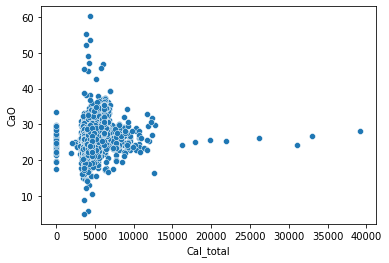

In [ ]:
sns.scatterplot(x = 'Cal_total',y = 'CaO',data = escoria)

In [ ]:
escoria.shape

(4127, 29)

(2.1745, 63.0155)

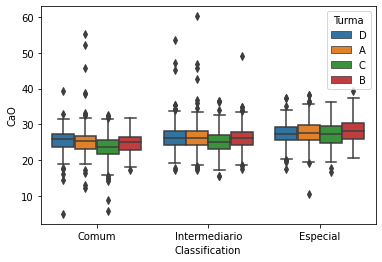

In [ ]:
sns.boxplot(x= 'Classification',y = 'CaO',data = escoria[escoria['Turma']!=""],hue = 'Turma')
plt.ylim()

In [ ]:
escoria[filtro].corr()

,S,Al2O3,BAS,CaO,Cr2O3,F,FeO,MgO,MnO,P2O5,RESIDUAL,SiO2,TOTAL,TiO2,Cal_total,aco_vazado_t,energia_kwh/t,calcitica_kg,dolomitica_kg,o2_ppm,tempo_forno_ligado_minutos,potencia_MW
S,1.000000,0.038430,0.009710,0.017765,0.009491,0.045484,0.008573,-0.008862,-0.019098,0.025190,-0.025230,0.001048,0.001065,0.002441,-0.003464,0.005567,-0.002834,-0.003897,-0.000143,0.042924,0.006599,-0.003307
Al2O3,0.038430,1.000000,-0.170304,0.084872,0.134181,0.284388,-0.180010,0.014855,0.016496,0.156904,-0.531690,0.195634,-0.022908,0.051864,-0.083106,0.000477,-0.020330,-0.082919,-0.029986,-0.049043,-0.029521,-0.025738
BAS,0.009710,-0.170304,1.000000,0.235288,-0.044147,0.067002,0.021499,-0.183495,-0.209751,0.247752,0.201892,-0.387800,0.030553,-0.046180,0.206335,-0.022474,0.069961,0.213577,0.055100,0.166405,0.088654,-0.028419
CaO,0.017765,0.084872,0.235288,1.000000,-0.326166,0.054228,-0.564715,0.133597,-0.104887,0.333337,-0.280006,0.395579,0.003552,-0.011643,0.190243,0.012421,0.053012,0.212910,0.010662,-0.028138,0.086414,-0.000791
Cr2O3,0.009491,0.134181,-0.044147,-0.326166,1.000000,0.059294,0.166815,0.027651,0.102804,0.163523,0.099052,-0.068842,-0.003115,0.028556,-0.108912,0.013621,-0.018569,-0.114448,-0.024781,-0.023666,-0.026272,0.017195
F,0.045484,0.284388,0.067002,0.054228,0.059294,1.000000,0.136085,-0.233943,-0.204004,0.088929,-0.333739,-0.180811,-0.010686,0.035220,0.039165,0.013382,0.031573,0.027934,0.042105,0.111428,0.027493,0.000277
FeO,0.008573,-0.180010,0.021499,-0.564715,0.166815,0.136085,1.000000,-0.457730,-0.165388,-0.128559,0.051494,-0.663577,0.006003,0.000880,0.044787,-0.029198,0.014682,0.039250,0.029807,0.098581,-0.022170,-0.001870
MgO,-0.008862,0.014855,-0.183495,0.133597,0.027651,-0.233943,-0.457730,1.000000,0.270537,0.030309,-0.016973,0.556132,0.001044,0.036564,-0.128711,0.012009,-0.026919,-0.130945,-0.040105,-0.277289,-0.040661,0.025048
MnO,-0.019098,0.016496,-0.209751,-0.104887,0.102804,-0.204004,-0.165388,0.270537,1.000000,0.039494,-0.013428,0.352829,-0.000826,0.024125,-0.156145,0.037830,-0.057876,-0.156781,-0.053861,-0.073314,-0.047808,0.014327
P2O5,0.025190,0.156904,0.247752,0.333337,0.163523,0.088929,-0.128559,0.030309,0.039494,1.000000,0.021763,-0.013891,0.008795,0.026367,0.097054,-0.001783,0.025825,0.102852,0.019914,-0.020389,0.025651,-0.008857


Text(0, 0.5, 'CaO (%)\n')

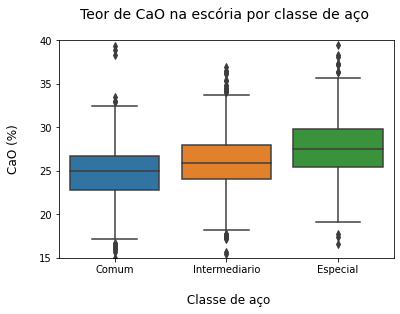

In [ ]:
sns.boxplot(x = 'Classification',y = 'CaO',data = escoria)
plt.ylim([15,40])
plt.title('Teor de CaO na escória por classe de aço \n',fontsize = 14)
plt.xlabel('\n Classe de aço',fontsize = 12)
plt.ylabel('CaO (%)\n',fontsize = 12)

Text(0, 0.5, 'SiO2 (%)\n')

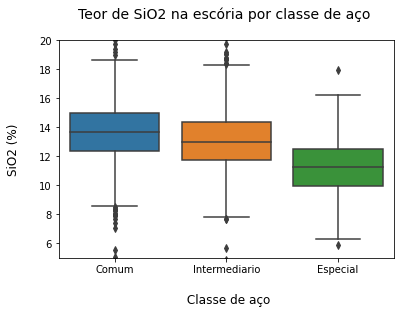

In [ ]:
sns.boxplot(x = 'Classification',y = 'SiO2',data = escoria)
plt.ylim([5,20])
plt.title('Teor de SiO2 na escória por classe de aço \n',fontsize = 14)
plt.xlabel('\n Classe de aço',fontsize = 12)
plt.ylabel('SiO2 (%)\n',fontsize = 12)

Text(0, 0.5, 'S (%)\n')

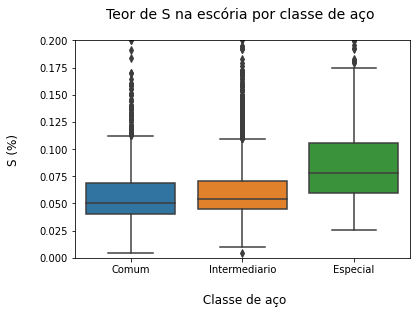

In [ ]:
sns.boxplot(x = 'Classification',y = 'S',data = escoria)
plt.ylim([0.0,0.2])
plt.title('Teor de S na escória por classe de aço \n',fontsize = 14)
plt.xlabel('\n Classe de aço',fontsize = 12)
plt.ylabel('S (%)\n',fontsize = 12)

Text(0, 0.5, 'Basicidade\n')

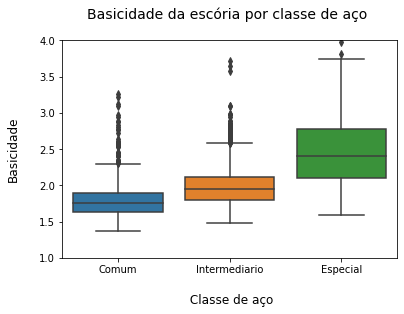

In [ ]:
sns.boxplot(x = 'Classification',y = 'BAS',data = escoria)
plt.ylim([1,4])
plt.title('Basicidade da escória por classe de aço \n',fontsize = 14)
plt.xlabel('\n Classe de aço',fontsize = 12)
plt.ylabel('Basicidade\n',fontsize = 12)

Text(0, 0.5, 'P2O5 (%)\n')

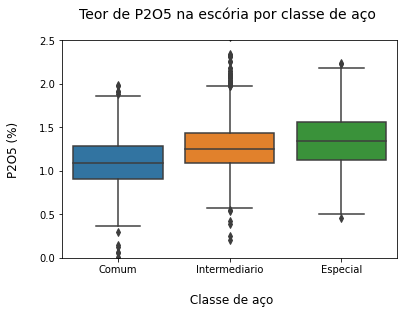

In [ ]:
sns.boxplot(x = 'Classification',y = 'P2O5',data = escoria)
plt.ylim([0,2.5])
plt.title('Teor de P2O5 na escória por classe de aço \n',fontsize = 14)
plt.xlabel('\n Classe de aço',fontsize = 12)
plt.ylabel('P2O5 (%)\n',fontsize = 12)

Text(0, 0.5, 'MgO (%)\n')

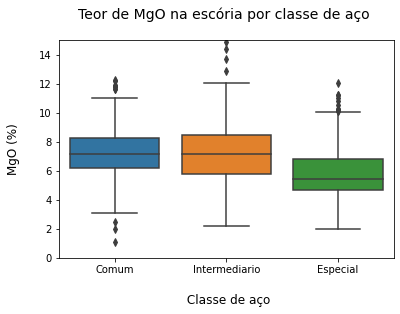

In [ ]:
sns.boxplot(x = 'Classification',y = 'MgO',data = escoria)
plt.ylim([0,15])
plt.title('Teor de MgO na escória por classe de aço \n',fontsize = 14)
plt.xlabel('\n Classe de aço',fontsize = 12)
plt.ylabel('MgO (%)\n',fontsize = 12)

(0.0, 15000.0)

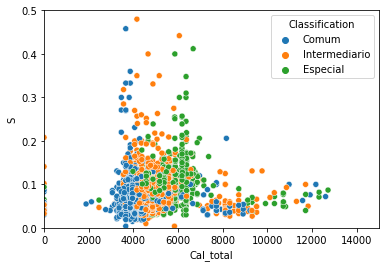

In [ ]:
sns.scatterplot(x = 'Cal_total',y= 'S',data =  escoria, hue = 'Classification')
plt.ylim([0,0.5])
plt.xlim([0,15000])

In [ ]:
escoria

,Mês,Data,Corrida,Grau Aço,S,Al2O3,BAS,CaO,Cr2O3,F,FeO,MgO,MnO,P2O5,RESIDUAL,SiO2,TOTAL,TiO2,Classification,Turma,Cal_total,aco_vazado_t,energia_kwh/t,calcitica_kg,dolomitica_kg,o2_ppm,tempo_forno_ligado_minutos,potencia_MW,coating
0,1,01/01/2021,B5662,1032,0.051,3.951,1.9726,22.367,2.237,1.614,31.660,6.968,8.586,0.936,9.2781,11.339,100.0,1.013,Comum,D,3758.0,82.94,455.52,2180.0,1578.0,0.0,32.58,68.51,IDEAL
1,1,01/01/2021,B5665,1032,0.052,5.374,1.7507,26.233,2.095,1.270,26.297,7.670,9.189,1.251,4.3776,14.985,100.0,1.207,Comum,D,3258.0,110.75,341.92,1680.0,1578.0,812.0,32.53,68.03,IDEAL
2,1,01/01/2021,B5666,1032,0.049,5.355,1.7077,25.891,2.196,1.334,26.494,7.898,9.338,1.277,3.7241,15.161,100.0,1.283,Comum,D,3061.0,108.37,349.76,1480.0,1581.0,0.0,34.10,64.87,IDEAL
3,1,01/01/2021,B5667,1032,0.041,5.033,1.7048,25.599,2.369,1.003,25.666,7.981,9.210,1.188,5.6687,15.016,100.0,1.225,Comum,D,3461.0,110.49,343.13,1880.0,1581.0,0.0,32.73,67.54,IDEAL
4,1,01/01/2021,B5668,ABNT1012,0.043,5.764,1.5423,25.284,2.025,1.141,26.550,8.128,9.127,0.858,3.3397,16.393,100.0,1.348,Intermediario,D,3260.0,125.09,292.53,1680.0,1580.0,0.0,33.02,66.33,IDEAL
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4258,12,11/12/2021,C3360,10B06,0.123,3.000,2.4690,26.337,1.856,0.657,34.951,5.709,6.216,1.297,16.1140,10.667,100.0,0.791,Especial,B,4586.0,106.25,380.56,3283.0,1303.0,0.0,35.63,67.74,IDEAL
4259,12,11/12/2021,C3361,10B06,0.126,3.053,2.5081,26.754,1.936,0.493,35.519,5.741,6.144,1.418,15.2168,10.667,100.0,0.779,Especial,B,4578.0,114.73,346.69,3279.0,1299.0,0.0,35.53,67.31,IDEAL
4260,12,11/12/2021,C3362,10B06,0.119,2.783,2.6465,23.940,1.927,0.644,37.358,6.615,5.856,1.166,18.0608,9.046,100.0,0.737,Especial,B,4582.0,106.25,369.70,3281.0,1301.0,0.0,35.73,65.98,IDEAL
4261,12,11/12/2021,C3363,10B06,0.102,3.137,2.1297,25.422,1.941,0.538,35.310,5.645,6.120,1.395,15.3927,11.937,100.0,0.860,Especial,C,4577.0,102.01,386.09,3278.0,1299.0,645.0,35.25,66.99,IDEAL


In [ ]:
escoria['CaO+MgO'] = escoria['CaO']+escoria['MgO']

Text(0, 0.5, 'CaO + MgO (%)\n')

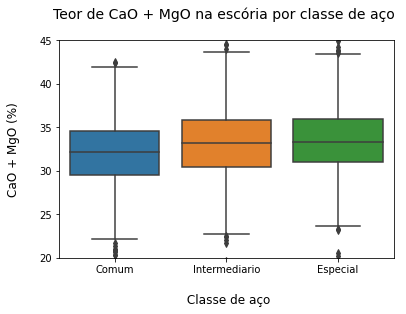

In [ ]:
sns.boxplot(x = 'Classification',y = 'CaO+MgO',data = escoria)
plt.ylim([20,45])
plt.title('Teor de CaO + MgO na escória por classe de aço \n',fontsize = 14)
plt.xlabel('\n Classe de aço',fontsize = 12)
plt.ylabel('CaO + MgO (%)\n',fontsize = 12)

Text(0, 0.5, 'MnO (%)\n')

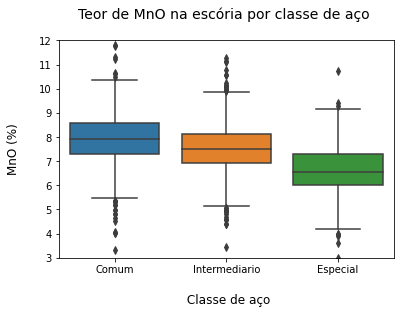

In [ ]:
sns.boxplot(x = 'Classification',y = 'MnO',data = escoria)
plt.ylim([3,12])
plt.title('Teor de MnO na escória por classe de aço \n',fontsize = 14)
plt.xlabel('\n Classe de aço',fontsize = 12)
plt.ylabel('MnO (%)\n',fontsize = 12)

Text(0, 0.5, 'FeO (%)\n')

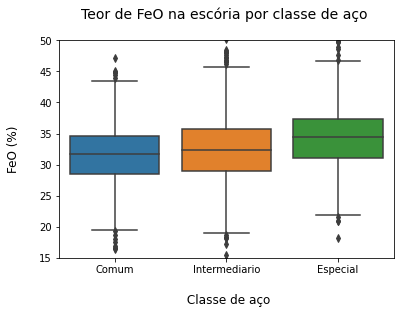

In [ ]:
sns.boxplot(x = 'Classification',y = 'FeO',data = escoria)
plt.ylim([15,50])
plt.title('Teor de FeO na escória por classe de aço \n',fontsize = 14)
plt.xlabel('\n Classe de aço',fontsize = 12)
plt.ylabel('FeO (%)\n',fontsize = 12)

Text(0, 0.5, 'Al2O3 (%)\n')

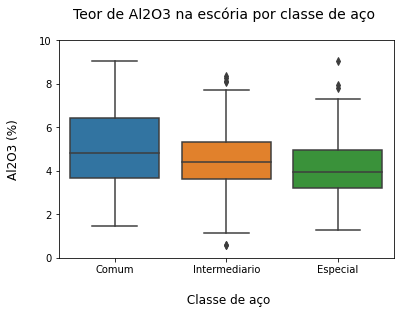

In [ ]:
sns.boxplot(x = 'Classification',y = 'Al2O3',data = escoria)
plt.ylim([0,10])
plt.title('Teor de Al2O3 na escória por classe de aço \n',fontsize = 14)
plt.xlabel('\n Classe de aço',fontsize = 12)
plt.ylabel('Al2O3 (%)\n',fontsize = 12)

In [ ]:
escoria['SiO2+Al2O3'] = escoria['Al2O3']+escoria['SiO2']

Text(0, 0.5, 'SiO2 + Al2O3 (%)\n')

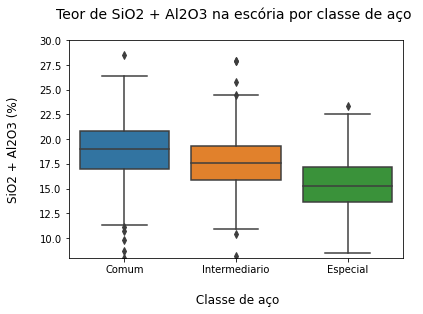

In [ ]:
sns.boxplot(x = 'Classification',y = 'SiO2+Al2O3',data = escoria)
plt.ylim([8,30])
plt.title('Teor de SiO2 + Al2O3 na escória por classe de aço \n',fontsize = 14)
plt.xlabel('\n Classe de aço',fontsize = 12)
plt.ylabel('SiO2 + Al2O3 (%)\n',fontsize = 12)

In [ ]:
escoria_comum = escoria[escoria['Classification'] =='Comum']

In [ ]:
escoria_comum.set_axis(range(escoria_comum.shape[0]),axis = 'index',inplace = True)

In [ ]:
escoria_comum.corr()

,S,Al2O3,BAS,CaO,Cr2O3,F,FeO,MgO,MnO,P2O5,RESIDUAL,SiO2,TOTAL,TiO2,Cal_total,aco_vazado_t,energia_kwh/t,calcitica_kg,dolomitica_kg,o2_ppm,tempo_forno_ligado_minutos,potencia_MW,CaO+MgO,SiO2+Al2O3
S,1.000000,0.262319,0.018863,0.094078,0.189366,0.319615,-0.043378,-0.015833,-0.020972,0.307796,-0.044300,0.037449,0.003957,0.385872,0.003215,0.024059,0.001101,-0.000132,0.009034,0.003118,0.029413,0.006840,0.070267,0.226540
Al2O3,0.262319,1.000000,0.002830,0.181244,0.236347,0.411896,-0.170340,-0.026899,-0.118653,0.400163,-0.454590,0.090669,-0.023268,0.474007,-0.007367,-0.012292,-0.009512,-0.012159,0.003758,-0.047259,-0.025899,-0.034685,0.136675,0.834806
BAS,0.018863,0.002830,1.000000,-0.016602,0.068554,0.121680,0.059317,-0.146709,-0.148619,0.120772,0.030138,-0.342417,0.074122,-0.067193,0.094998,-0.020767,0.010279,0.112644,0.038185,0.006515,0.018260,-0.045671,-0.066462,-0.187074
CaO,0.094078,0.181244,-0.016602,1.000000,-0.190172,0.050443,-0.586688,0.371046,0.016183,0.172383,-0.472428,0.689067,-0.011858,0.049127,0.082772,-0.012778,-0.012367,0.132337,-0.033833,-0.119042,0.010257,-0.004512,0.941934,0.523150
Cr2O3,0.189366,0.236347,0.068554,-0.190172,1.000000,0.252047,0.153842,-0.064132,-0.011692,0.360949,0.021237,-0.137276,0.004739,0.417814,-0.060103,0.000461,0.011570,-0.077750,-0.011434,0.040361,0.013539,0.003845,-0.176805,0.109568
F,0.319615,0.411896,0.121680,0.050443,0.252047,1.000000,0.087557,-0.210931,-0.272611,0.328279,-0.339047,-0.157038,-0.011530,0.410401,0.015970,-0.010274,-0.014133,0.000744,0.042126,-0.005443,-0.018043,-0.043212,-0.035529,0.236393
FeO,-0.043378,-0.170340,0.059317,-0.586688,0.153842,0.087557,1.000000,-0.424013,-0.128889,-0.060631,0.094871,-0.595604,0.009853,-0.106702,-0.037752,-0.024714,-0.042128,-0.076120,0.046366,0.097351,-0.079520,-0.051210,-0.627231,-0.462925
MgO,-0.015833,-0.026899,-0.146709,0.371046,-0.064132,-0.210931,-0.424013,1.000000,0.306936,0.016367,-0.082691,0.582579,0.001151,0.107434,-0.054684,0.049034,0.034919,-0.072371,-0.007203,-0.211560,0.049519,0.089691,0.661326,0.300955
MnO,-0.020972,-0.118653,-0.148619,0.016183,-0.011692,-0.272611,-0.128889,0.306936,1.000000,0.059124,0.041982,0.381464,0.015304,0.207019,-0.080710,0.079353,0.000840,-0.096508,-0.030861,-0.042391,0.034695,0.052103,0.124063,0.117777
P2O5,0.307796,0.400163,0.120772,0.172383,0.360949,0.328279,-0.060631,0.016367,0.059124,1.000000,-0.031298,-0.002515,0.007404,0.560602,0.021500,0.001356,-0.003913,0.031377,-0.002906,0.009254,-0.001785,-0.011740,0.145163,0.312610


In [ ]:
escoria.shape

(4127, 31)

In [ ]:
escoria_comum.corr()

,S,Al2O3,BAS,CaO,Cr2O3,F,FeO,MgO,MnO,P2O5,RESIDUAL,SiO2,TOTAL,TiO2,Cal_total,aco_vazado_t,energia_kwh/t,calcitica_kg,dolomitica_kg,o2_ppm,tempo_forno_ligado_minutos,potencia_MW,CaO+MgO,SiO2+Al2O3
S,1.000000,0.262319,0.018863,0.094078,0.189366,0.319615,-0.043378,-0.015833,-0.020972,0.307796,-0.044300,0.037449,0.003957,0.385872,0.003215,0.024059,0.001101,-0.000132,0.009034,0.003118,0.029413,0.006840,0.070267,0.226540
Al2O3,0.262319,1.000000,0.002830,0.181244,0.236347,0.411896,-0.170340,-0.026899,-0.118653,0.400163,-0.454590,0.090669,-0.023268,0.474007,-0.007367,-0.012292,-0.009512,-0.012159,0.003758,-0.047259,-0.025899,-0.034685,0.136675,0.834806
BAS,0.018863,0.002830,1.000000,-0.016602,0.068554,0.121680,0.059317,-0.146709,-0.148619,0.120772,0.030138,-0.342417,0.074122,-0.067193,0.094998,-0.020767,0.010279,0.112644,0.038185,0.006515,0.018260,-0.045671,-0.066462,-0.187074
CaO,0.094078,0.181244,-0.016602,1.000000,-0.190172,0.050443,-0.586688,0.371046,0.016183,0.172383,-0.472428,0.689067,-0.011858,0.049127,0.082772,-0.012778,-0.012367,0.132337,-0.033833,-0.119042,0.010257,-0.004512,0.941934,0.523150
Cr2O3,0.189366,0.236347,0.068554,-0.190172,1.000000,0.252047,0.153842,-0.064132,-0.011692,0.360949,0.021237,-0.137276,0.004739,0.417814,-0.060103,0.000461,0.011570,-0.077750,-0.011434,0.040361,0.013539,0.003845,-0.176805,0.109568
F,0.319615,0.411896,0.121680,0.050443,0.252047,1.000000,0.087557,-0.210931,-0.272611,0.328279,-0.339047,-0.157038,-0.011530,0.410401,0.015970,-0.010274,-0.014133,0.000744,0.042126,-0.005443,-0.018043,-0.043212,-0.035529,0.236393
FeO,-0.043378,-0.170340,0.059317,-0.586688,0.153842,0.087557,1.000000,-0.424013,-0.128889,-0.060631,0.094871,-0.595604,0.009853,-0.106702,-0.037752,-0.024714,-0.042128,-0.076120,0.046366,0.097351,-0.079520,-0.051210,-0.627231,-0.462925
MgO,-0.015833,-0.026899,-0.146709,0.371046,-0.064132,-0.210931,-0.424013,1.000000,0.306936,0.016367,-0.082691,0.582579,0.001151,0.107434,-0.054684,0.049034,0.034919,-0.072371,-0.007203,-0.211560,0.049519,0.089691,0.661326,0.300955
MnO,-0.020972,-0.118653,-0.148619,0.016183,-0.011692,-0.272611,-0.128889,0.306936,1.000000,0.059124,0.041982,0.381464,0.015304,0.207019,-0.080710,0.079353,0.000840,-0.096508,-0.030861,-0.042391,0.034695,0.052103,0.124063,0.117777
P2O5,0.307796,0.400163,0.120772,0.172383,0.360949,0.328279,-0.060631,0.016367,0.059124,1.000000,-0.031298,-0.002515,0.007404,0.560602,0.021500,0.001356,-0.003913,0.031377,-0.002906,0.009254,-0.001785,-0.011740,0.145163,0.312610


Text(0, 0.5, 'CaO (%)\n')

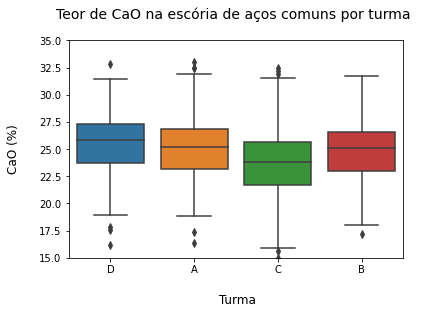

In [ ]:
sns.boxplot(x = 'Turma',y = 'CaO',data = escoria_comum[escoria_comum['Turma']!=""])
plt.ylim([15,35])
plt.title('Teor de CaO na escória de aços comuns por turma \n',fontsize = 14)
plt.xlabel('\n Turma',fontsize = 12)
plt.ylabel('CaO (%)\n',fontsize = 12)

Text(0, 0.5, 'SiO2 (%)\n')

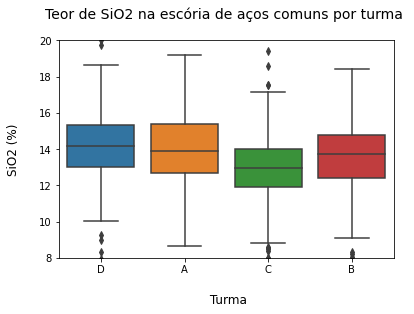

In [ ]:
sns.boxplot(x = 'Turma',y = 'SiO2',data = escoria_comum[escoria_comum['Turma']!=""])
plt.ylim([8,20])
plt.title('Teor de SiO2 na escória de aços comuns por turma \n',fontsize = 14)
plt.xlabel('\n Turma',fontsize = 12)
plt.ylabel('SiO2 (%)\n',fontsize = 12)

Text(0, 0.5, 'Al2O3 (%)\n')

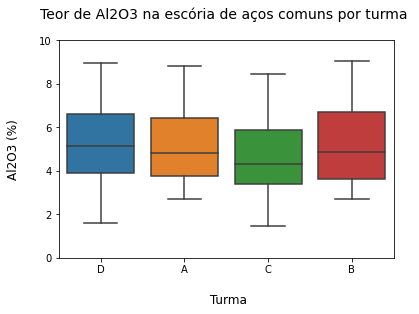

In [ ]:
sns.boxplot(x = 'Turma',y = 'Al2O3',data = escoria_comum[escoria_comum['Turma']!=""])
plt.ylim([0,10])
plt.title('Teor de Al2O3 na escória de aços comuns por turma \n',fontsize = 14)
plt.xlabel('\n Turma',fontsize = 12)
plt.ylabel('Al2O3 (%)\n',fontsize = 12)

Text(0, 0.5, 'MgO (%)\n')

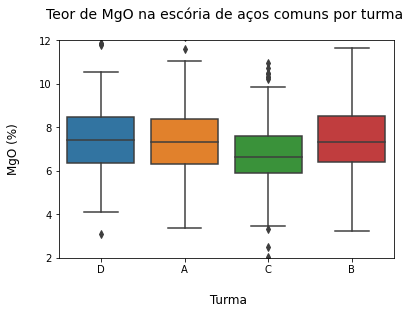

In [ ]:
sns.boxplot(x = 'Turma',y = 'MgO',data = escoria_comum[escoria_comum['Turma']!=""])
plt.ylim([2,12])
plt.title('Teor de MgO na escória de aços comuns por turma \n',fontsize = 14)
plt.xlabel('\n Turma',fontsize = 12)
plt.ylabel('MgO (%)\n',fontsize = 12)

Text(0, 0.5, 'S (%)\n')

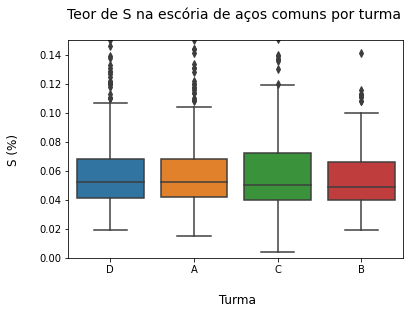

In [ ]:
sns.boxplot(x = 'Turma',y = 'S',data = escoria_comum[escoria_comum['Turma']!=""])
plt.ylim([0,0.15])
plt.title('Teor de S na escória de aços comuns por turma \n',fontsize = 14)
plt.xlabel('\n Turma',fontsize = 12)
plt.ylabel('S (%)\n',fontsize = 12)

Text(0, 0.5, 'P2O5 (%)\n')

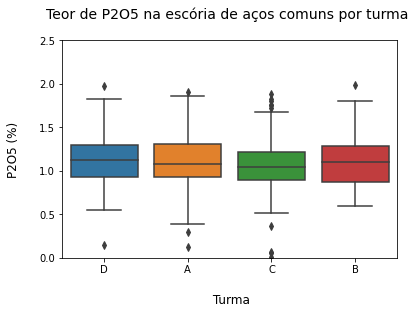

In [ ]:
sns.boxplot(x = 'Turma',y = 'P2O5',data = escoria_comum[escoria_comum['Turma']!=""])
plt.ylim([0,2.5])
plt.title('Teor de P2O5 na escória de aços comuns por turma \n',fontsize = 14)
plt.xlabel('\n Turma',fontsize = 12)
plt.ylabel('P2O5 (%)\n',fontsize = 12)

Text(0, 0.5, 'FeO (%)\n')

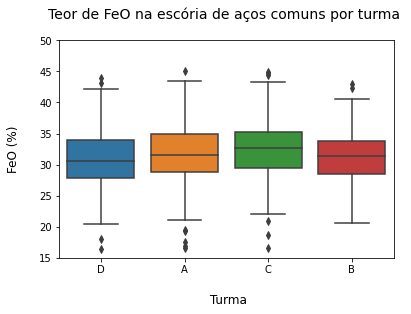

In [ ]:
sns.boxplot(x = 'Turma',y = 'FeO',data = escoria_comum[escoria_comum['Turma']!=""])
plt.ylim([15,50])
plt.title('Teor de FeO na escória de aços comuns por turma \n',fontsize = 14)
plt.xlabel('\n Turma',fontsize = 12)
plt.ylabel('FeO (%)\n',fontsize = 12)

Text(0, 0.5, 'MnO (%)\n')

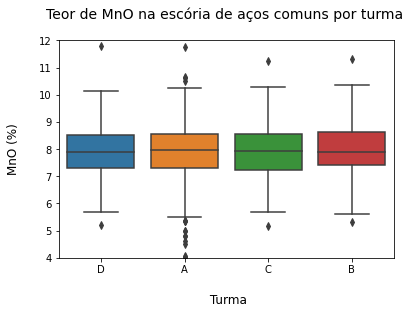

In [ ]:
sns.boxplot(x = 'Turma',y = 'MnO',data = escoria_comum[escoria_comum['Turma']!=""])
plt.ylim([4,12])
plt.title('Teor de MnO na escória de aços comuns por turma \n',fontsize = 14)
plt.xlabel('\n Turma',fontsize = 12)
plt.ylabel('MnO (%)\n',fontsize = 12)

Text(0, 0.5, 'Basicidade\n')

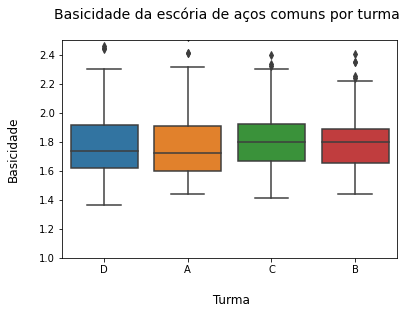

In [ ]:
sns.boxplot(x = 'Turma',y = 'BAS',data = escoria_comum[escoria_comum['Turma']!=""])
plt.ylim([1,2.5])
plt.title('Basicidade da escória de aços comuns por turma \n',fontsize = 14)
plt.xlabel('\n Turma',fontsize = 12)
plt.ylabel('Basicidade\n',fontsize = 12)

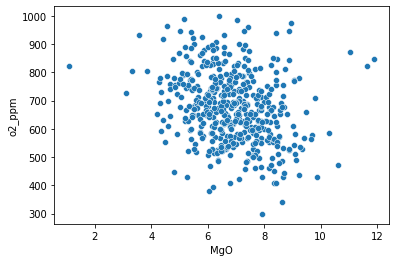

In [ ]:
sns.scatterplot(x = 'MgO', y = 'o2_ppm',data = escoria_comum[escoria_comum['o2_ppm']>100])


In [ ]:
escoria_comum.corr()

,S,Al2O3,BAS,CaO,Cr2O3,F,FeO,MgO,MnO,P2O5,RESIDUAL,SiO2,TOTAL,TiO2,Cal_total,aco_vazado_t,energia_kwh/t,calcitica_kg,dolomitica_kg,o2_ppm,tempo_forno_ligado_minutos,potencia_MW,CaO+MgO,SiO2+Al2O3
S,1.000000,0.262319,0.018863,0.094078,0.189366,0.319615,-0.043378,-0.015833,-0.020972,0.307796,-0.044300,0.037449,0.003957,0.385872,0.003215,0.024059,0.001101,-0.000132,0.009034,0.003118,0.029413,0.006840,0.070267,0.226540
Al2O3,0.262319,1.000000,0.002830,0.181244,0.236347,0.411896,-0.170340,-0.026899,-0.118653,0.400163,-0.454590,0.090669,-0.023268,0.474007,-0.007367,-0.012292,-0.009512,-0.012159,0.003758,-0.047259,-0.025899,-0.034685,0.136675,0.834806
BAS,0.018863,0.002830,1.000000,-0.016602,0.068554,0.121680,0.059317,-0.146709,-0.148619,0.120772,0.030138,-0.342417,0.074122,-0.067193,0.094998,-0.020767,0.010279,0.112644,0.038185,0.006515,0.018260,-0.045671,-0.066462,-0.187074
CaO,0.094078,0.181244,-0.016602,1.000000,-0.190172,0.050443,-0.586688,0.371046,0.016183,0.172383,-0.472428,0.689067,-0.011858,0.049127,0.082772,-0.012778,-0.012367,0.132337,-0.033833,-0.119042,0.010257,-0.004512,0.941934,0.523150
Cr2O3,0.189366,0.236347,0.068554,-0.190172,1.000000,0.252047,0.153842,-0.064132,-0.011692,0.360949,0.021237,-0.137276,0.004739,0.417814,-0.060103,0.000461,0.011570,-0.077750,-0.011434,0.040361,0.013539,0.003845,-0.176805,0.109568
F,0.319615,0.411896,0.121680,0.050443,0.252047,1.000000,0.087557,-0.210931,-0.272611,0.328279,-0.339047,-0.157038,-0.011530,0.410401,0.015970,-0.010274,-0.014133,0.000744,0.042126,-0.005443,-0.018043,-0.043212,-0.035529,0.236393
FeO,-0.043378,-0.170340,0.059317,-0.586688,0.153842,0.087557,1.000000,-0.424013,-0.128889,-0.060631,0.094871,-0.595604,0.009853,-0.106702,-0.037752,-0.024714,-0.042128,-0.076120,0.046366,0.097351,-0.079520,-0.051210,-0.627231,-0.462925
MgO,-0.015833,-0.026899,-0.146709,0.371046,-0.064132,-0.210931,-0.424013,1.000000,0.306936,0.016367,-0.082691,0.582579,0.001151,0.107434,-0.054684,0.049034,0.034919,-0.072371,-0.007203,-0.211560,0.049519,0.089691,0.661326,0.300955
MnO,-0.020972,-0.118653,-0.148619,0.016183,-0.011692,-0.272611,-0.128889,0.306936,1.000000,0.059124,0.041982,0.381464,0.015304,0.207019,-0.080710,0.079353,0.000840,-0.096508,-0.030861,-0.042391,0.034695,0.052103,0.124063,0.117777
P2O5,0.307796,0.400163,0.120772,0.172383,0.360949,0.328279,-0.060631,0.016367,0.059124,1.000000,-0.031298,-0.002515,0.007404,0.560602,0.021500,0.001356,-0.003913,0.031377,-0.002906,0.009254,-0.001785,-0.011740,0.145163,0.312610


In [ ]:
lista  = []
cal_total_lista = []
for coluna in escoria_comum.columns:
    aux = []
    aux2 = []
    for i in range(escoria_comum.shape[0]):
      if escoria[coluna].values[i] == 0:
        continue
      aux2.append((escoria_comum['Cal_total'].values[i]))
      aux.append(escoria_comum[coluna].values[i])
    lista.append(aux)
    cal_total_lista.append(aux2)


In [ ]:
for i in range(escoria.shape[1]):
  colunas[i] = escoria_comum.columns[i]

In [ ]:
for i in range(4,len(lista)):
  if cal_total_lista[i] == []:
    continue
  if i == 18 or i==19:
    continue
  if i == 28:
    continue
  X = cal_total_lista[i]
  X = np.array(X)
  X = X.astype(float)
  X = sm.add_constant(X)
  Y = lista[i]
  Y = np.array(Y)
  Y = Y.astype(float)
  print('x = '+ colunas[i]+' y = Cal total')
  modelo = sm.OLS(Y,X)
  resultado = modelo.fit()
  print(resultado.summary())

x = S y = Cal total
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                 -0.001
Method:                 Least Squares   F-statistic:                   0.01332
Date:                Mon, 17 Jan 2022   Prob (F-statistic):              0.908
Time:                        13:14:43   Log-Likelihood:                -180.54
No. Observations:                1291   AIC:                             365.1
Df Residuals:                    1289   BIC:                             375.4
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0788      0.025

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

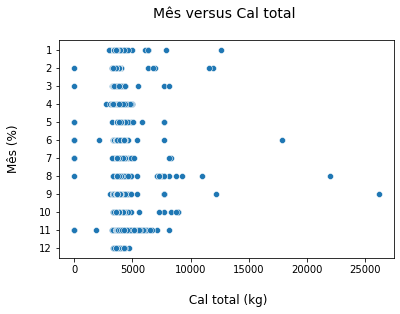

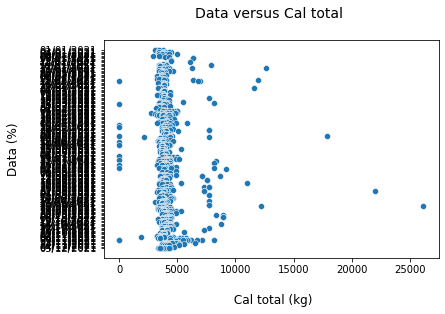

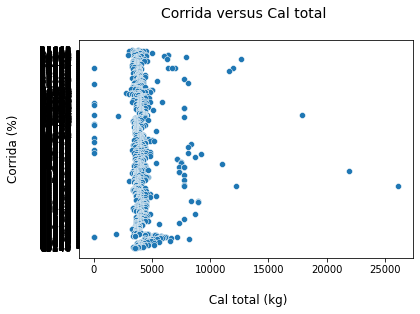

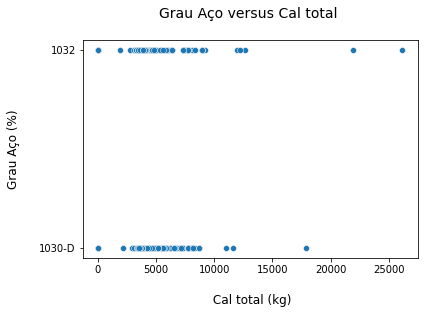

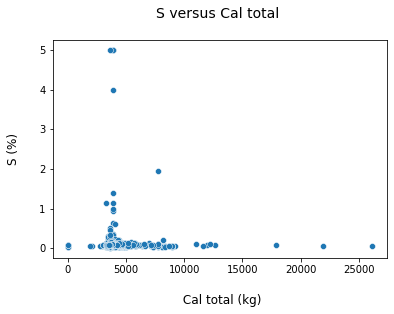

...

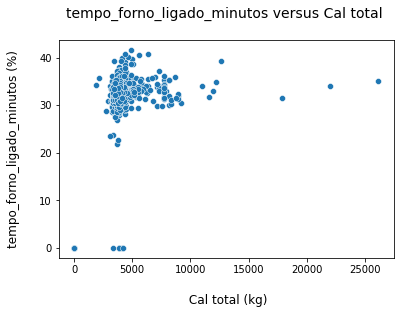

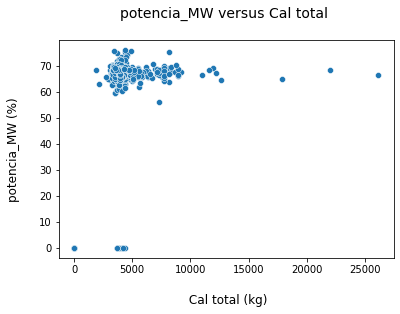

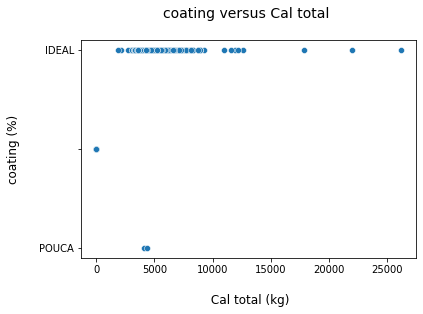

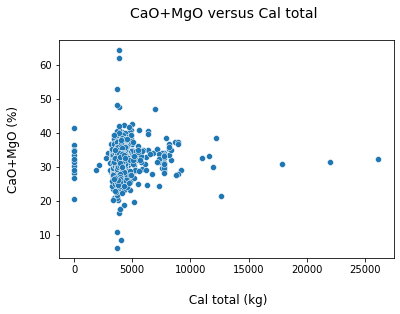

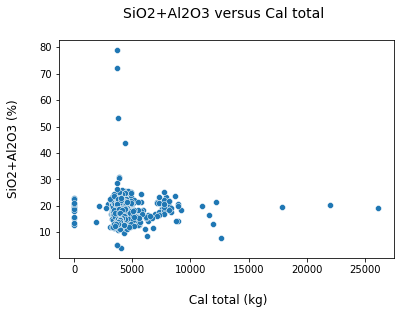

In [ ]:
for i in range(escoria.shape[1]):
  plt.figure()
  sns.scatterplot(x = cal_total_lista[i],y = lista[i])
  plt.xlabel('\n Cal total (kg)',fontsize = 12)
  plt.ylabel(colunas[i]+' (%)\n',fontsize = 12)
  plt.title(colunas[i] + ' versus Cal total \n', fontsize = 14)

In [ ]:
len(cal_total_lista)

31

In [ ]:
len(lista[0])

1291

#Parte 2 do trabalho

In [ ]:
especial_processo = FEA_1[FEA_1['Classification'] == 'Especial']
intermediario_processo = FEA_1[FEA_1['Classification'] == 'Intermediario']

In [ ]:
q1_intermediario_processo = intermediario_processo['Cal_total'].quantile(0.25)
q3_intermediario_processo = intermediario_processo['Cal_total'].quantile(0.75)
Iq_intermediario_processo = q3 - q1
lim_inf_intermediario_processo = q1 - 1.5*Iq_intermediario_processo
lim_sup_intermediario_processo = q3 + 1.5*Iq_intermediario_processo

In [ ]:
lim_sup_intermediario_processo

4907.5

In [ ]:
intermediario_processo =intermediario_processo[intermediario_processo['Cal_total']>lim_inf_intermediario_processo]
intermediario_processo =intermediario_processo[intermediario_processo['Cal_total']<lim_sup_intermediario_processo]

In [ ]:
intermediario_processo

,Corrida SAA,Corrida MES,Aco,Turno,Turma,Data,kg SiO2 esperada /t,kg SiO2 extra /t,Peso Carregado (t/cor),Carregamento Cesto 1,Carregamento Cesto 2,Carregamento Cesto 3,GUSS (t/cor),SHRE (t/cor),Gusa Eqv.,O2 / GUSSEQ,Densidade Teórica [t/m³],Rendimento Teórico %,RM sem Ligas %,RM com Ligas FE/FP %,Número de Carregamentos,TAP to TAP (min/corr),T.F.Ligado (min/corr),Power Off (min/corr),Power Off Bruto (min/corr),Produtividade (t/h),Aço Líquido Vazado (t/cor),Produção de Tarugos (t/corr),Consumo de Energia Elétrica (MWh/cor),Consumo de Energia Elétrica (kWh/t),Potência (MW),%FeO na escória FEA,%SiO2 na escória FEA,%CaO na escória FEA,Basicidade,%FeO na escória BAIA,%SiO2 na escória BAIA,Basicidade BAIA,Peso Escória (kg/t),Coque Injetado [kg],...,Pé Liquido (t) Corrigido,Coating de Panela,Temperatura de Vazamento Forno (°C),PPM O2 vazamento,Vida de Canal EBT (nº corridas),Vida Miolo (Delta) (nº corridas),Panela,Vida (n° corridas),Corrente A [kA],Corrente B [kA],Corrente C [kA],Consumo de Eletrodo Teórico [kg/t],Consumo de Ponta [kg/t],I²t,Escorificante FEA [kg/t],FeSiMn (kg)\r\n7071931,FeSiMn saco (kg),CaF2 (kg) \r\n4059595,FeSI 75 (kg)\r\n7071923,Coque Correção (kg)\r\n8800075,FeSiMn fino (kg)\r\n7071930,SiC (kg)\r\n28736,CaC2 (kg)\r\n7070998,Grafite BN (kg)\r\n7071938,FeB (kg)\r\n7071926,Coque Bag PPC (kg)\r\n7071997,CaSi (kg)\r\n7071935,CaSi Granulado (kg)\r\n7071936,FeV (kg)\r\n7071932,Alumínio Barra (kg)\r\n28685,FeNb (kg)\r\n7071977,Grafite saquinho (kg)\r\n7072675,Coque verde Injetado (kg)\r\n7071998,FeCr (kg)\r\n7071970,CaF2 saco (kg)\r\n7071924,Calcitica (kg) 7071955,Dolomitica (kg) 7071957,Classification,Cales_total_kg,Cal_total
6,48150,B5668,ABNT1012,1,D,1/1/2021,"7,99","12,78","119,80","86,40","25,80","7,60","31,10","28,00","48,91","54,04","0,77","89,89","104,16","104,16",3,"43,30","33,02","10,28","10,25","173,33","125,09","124,79","36,50","292,53","66,33","26,55","16,39","25,28","1,54",,,,"0,78","787,00",...,"26,86",IDEAL,,,438,438,2,122,"49,95","49,88","49,16","0,45","0,45","90,25","26,06",752,,0,0,,,,,,,,,,,,,,,0,,1680,1580,Intermediario,3260,3260
7,48151,B5669,AM60B,1,D,1/1/2021,"8,06","19,45","121,40","81,00","27,40","13,00","32,00","26,00","50,84","54,02","0,76","89,70","74,67","74,67",3,"43,27","33,55","9,72","9,67","126,11","90,94","90,64","38,48","424,54","67,66","23,84","15,89","27,86","1,75",,,,"1,22","821,00",...,"9,46",IDEAL,,594,439,439,7,38,"50,21","50,17","48,93","0,64","0,64","89,01","43,55",757,,102,0,,,,,,,,,,,,,,,0,,2381,1580,Intermediario,3961,3961
8,48152,B5670,AM60B,1,D,1/1/2021,"8,19",,"121,00","86,50","28,50","6,00","32,50","22,50","47,21","55,62","0,77","89,58","85,37","85,37",3,"42,98","32,23","10,75","10,72","144,61","103,59","103,29","37,78","365,74","69,58",,,,,,,,,"722,00",...,"27,41",IDEAL,,654,440,440,6,12,"49,70","49,55","49,02","0,53","0,53","92,00","40,18",750,,98,0,,,,,,,,,,,,,,,0,,2581,1581,Intermediario,4162,4162
9,48153,B5671,AM60B,1,D,1/1/2021,"8,01",,"120,20","86,10","25,60","8,50","30,70","29,20","47,94","48,04","0,76","89,64","91,20","91,20",3,"50,30","31,50","18,80","18,73","131,11","109,92","109,62","36,44","332,45","68,51",,,,,,,,,"683,00",...,"32,21",IDEAL,,863,441,441,2,123,"49,77","49,21","48,75","0,42","0,42","93,80","37,82",656,,101,0,,,,,,,,,,,,,,,0,,2579,1578,Intermediario,4157,4157
10,48154,B5672,AM60B,2,A,1/1/2021,"8,01","16,79","120,00","85,50","26,50","8,00","31,10","27,30","48,59","55,36","0,77","89,89","89,59","89,59",3,"50,92","35,00","15,92","15,78","127,03","107,81","107,51","39,95","371,60","67,47","24,23","16,38","29,68","1,81","26,39","14,97","1,80","1,03","863,00",...,"30,04",IDEAL,,,442,442,3,86,"48,55","48,05","48,56","0,45","0,45","82,95","38,61",639,,101,0,,,,,,,,,,,,,,,0,,2581,1581,Intermediario,4162,4162
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,..

In [ ]:
q1_especial_processo = especial_processo['Cal_total'].quantile(0.25)
q3_especial_processo = especial_processo['Cal_total'].quantile(0.75)
Iq_especial_processo = q3 - q1
lim_inf_especial_processo = q1 - 1.5*Iq_especial_processo
lim_sup_especial_processo = q3 + 1.5*Iq_especial_processo

In [ ]:
especial_processo

,Corrida SAA,Corrida MES,Aco,Turno,Turma,Data,kg SiO2 esperada /t,kg SiO2 extra /t,Peso Carregado (t/cor),Carregamento Cesto 1,Carregamento Cesto 2,Carregamento Cesto 3,GUSS (t/cor),SHRE (t/cor),Gusa Eqv.,O2 / GUSSEQ,Densidade Teórica [t/m³],Rendimento Teórico %,RM sem Ligas %,RM com Ligas FE/FP %,Número de Carregamentos,TAP to TAP (min/corr),T.F.Ligado (min/corr),Power Off (min/corr),Power Off Bruto (min/corr),Produtividade (t/h),Aço Líquido Vazado (t/cor),Produção de Tarugos (t/corr),Consumo de Energia Elétrica (MWh/cor),Consumo de Energia Elétrica (kWh/t),Potência (MW),%FeO na escória FEA,%SiO2 na escória FEA,%CaO na escória FEA,Basicidade,%FeO na escória BAIA,%SiO2 na escória BAIA,Basicidade BAIA,Peso Escória (kg/t),Coque Injetado [kg],...,Pé Liquido (t) Corrigido,Coating de Panela,Temperatura de Vazamento Forno (°C),PPM O2 vazamento,Vida de Canal EBT (nº corridas),Vida Miolo (Delta) (nº corridas),Panela,Vida (n° corridas),Corrente A [kA],Corrente B [kA],Corrente C [kA],Consumo de Eletrodo Teórico [kg/t],Consumo de Ponta [kg/t],I²t,Escorificante FEA [kg/t],FeSiMn (kg)\r\n7071931,FeSiMn saco (kg),CaF2 (kg) \r\n4059595,FeSI 75 (kg)\r\n7071923,Coque Correção (kg)\r\n8800075,FeSiMn fino (kg)\r\n7071930,SiC (kg)\r\n28736,CaC2 (kg)\r\n7070998,Grafite BN (kg)\r\n7071938,FeB (kg)\r\n7071926,Coque Bag PPC (kg)\r\n7071997,CaSi (kg)\r\n7071935,CaSi Granulado (kg)\r\n7071936,FeV (kg)\r\n7071932,Alumínio Barra (kg)\r\n28685,FeNb (kg)\r\n7071977,Grafite saquinho (kg)\r\n7072675,Coque verde Injetado (kg)\r\n7071998,FeCr (kg)\r\n7071970,CaF2 saco (kg)\r\n7071924,Calcitica (kg) 7071955,Dolomitica (kg) 7071957,Classification,Cales_total_kg,Cal_total
38,48182,B5700,1016-B,1,D,1/2/2021,"7,99",,"120,00","84,90","28,00","7,10","32,00","29,20","53,95","54,29","0,80","90,04","91,09","91,09",3,"43,25","33,83","9,42","9,33","152,05","109,60","109,30","38,87","355,60","67,41",,,,,,,,,"559,00",...,"94,08",IDEAL,,888,470,470,7,45,"49,47","48,86","48,99","0,52","0,52","87,08","37,95",1105,,150,0,,,,,,,,,,,,,,,0,,2580,1580,Especial,4160,4160
39,48183,B5701,1421,1,D,1/2/2021,"8,11",,"117,70","84,20","26,00","7,50","31,60","26,70","55,22","50,92","0,78","90,00","91,74","91,74",3,"41,98","32,87","9,11","9,08","154,76","108,28","107,98","36,69","339,75","65,63",,,,,,,,,"679,00",...,,IDEAL,,,471,471,2,17,"48,77","48,71","49,18","0,52","0,52","89,24","36,57",999,,149,0,,,,,,,,,,,,,,,0,,2379,1581,Especial,3960,3960
40,48184,B5702,1515-B,2,B,1/2/2021,"7,93",,"122,00","84,50","24,90","12,60","31,80","25,00","45,89","58,67","0,75","90,09","89,19","89,19",3,"44,60","33,52","11,08","11,08","146,78","109,11","108,81","36,58","336,14","64,65",,,,,,,,,"740,00",...,,IDEAL,,,472,472,5,73,"49,11","49,59","49,72","0,51","0,51","88,56","34,44",1495,,152,0,,,,,,,,,,,,,,,0,,2180,1578,Especial,3758,3758
129,48273,B5791,1045,1,B,1/7/2021,"8,03","18,06","125,00","87,60","37,40",,"32,00","43,20","66,38","48,92","0,77","89,81","81,44","81,44",2,"49,23","34,97","14,26","14,23","124,43","102,10","101,80","41,20","404,77","69,27","28,46","13,05","27,04","2,07",,,,"1,38","922,00",...,"31,02",IDEAL,,,561,561,3,114,"50,75","51,20","49,92","0,54","0,54","86,86","46,61",890,,103,0,,,,,,,,,,,,,,,0,,3179,1580,Especial,4759,4759
130,48274,B5792,1045,1,B,1/7/2021,"7,94","18,78","125,40","77,70","47,70",,"31,20","42,80","60,63","51,24","0,77","89,81","81,18","81,18",2,"42,18","33,70","8,48","8,42","145,23","102,10","101,80","39,55","388,54","69,19","22,01","15,46","30,82","1,99",,,,"1,22","747,00",...,"41,19",IDEAL,,,562,562,7,54,"49,12","50,49","48,53","0,57","0,57","87,91","46,64",997,,102,0,,,,,,,,,,,,,,,0,,3180,1582,Especial,4762,4762
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7632,C3367,C3367,1020,2,C,12/11/

In [ ]:
especial_processo.set_axis(range(especial_processo.shape[0]),axis= 'index',inplace = True)

In [ ]:
intermediario_processo.set_axis(range(intermediario_processo.shape[0]),axis= 'index',inplace = True)

In [ ]:
FEA_1_sem_outliers = pd.concat([acos_comuns_sem_outliers,intermediario_processo,especial_processo,],ignore_index=True)

(2000.0, 9000.0)

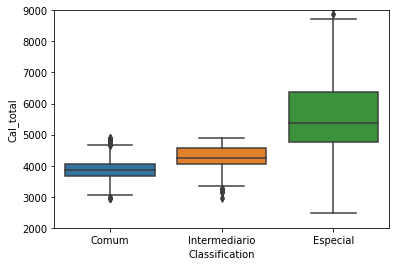

In [ ]:
sns.boxplot(x = 'Classification',y = 'Cal_total',data = FEA_1_sem_outliers)
plt.ylim([2000,9000])

In [ ]:
FEA_1_sem_outliers

,Corrida SAA,Corrida MES,Aco,Turno,Turma,Data,kg SiO2 esperada /t,kg SiO2 extra /t,Peso Carregado (t/cor),Carregamento Cesto 1,Carregamento Cesto 2,Carregamento Cesto 3,GUSS (t/cor),SHRE (t/cor),Gusa Eqv.,O2 / GUSSEQ,Densidade Teórica [t/m³],Rendimento Teórico %,RM sem Ligas %,RM com Ligas FE/FP %,Número de Carregamentos,TAP to TAP (min/corr),T.F.Ligado (min/corr),Power Off (min/corr),Power Off Bruto (min/corr),Produtividade (t/h),Aço Líquido Vazado (t/cor),Produção de Tarugos (t/corr),Consumo de Energia Elétrica (MWh/cor),Consumo de Energia Elétrica (kWh/t),Potência (MW),%FeO na escória FEA,%SiO2 na escória FEA,%CaO na escória FEA,Basicidade,%FeO na escória BAIA,%SiO2 na escória BAIA,Basicidade BAIA,Peso Escória (kg/t),Coque Injetado [kg],...,Pé Liquido (t) Corrigido,Coating de Panela,Temperatura de Vazamento Forno (°C),PPM O2 vazamento,Vida de Canal EBT (nº corridas),Vida Miolo (Delta) (nº corridas),Panela,Vida (n° corridas),Corrente A [kA],Corrente B [kA],Corrente C [kA],Consumo de Eletrodo Teórico [kg/t],Consumo de Ponta [kg/t],I²t,Escorificante FEA [kg/t],FeSiMn (kg)\r\n7071931,FeSiMn saco (kg),CaF2 (kg) \r\n4059595,FeSI 75 (kg)\r\n7071923,Coque Correção (kg)\r\n8800075,FeSiMn fino (kg)\r\n7071930,SiC (kg)\r\n28736,CaC2 (kg)\r\n7070998,Grafite BN (kg)\r\n7071938,FeB (kg)\r\n7071926,Coque Bag PPC (kg)\r\n7071997,CaSi (kg)\r\n7071935,CaSi Granulado (kg)\r\n7071936,FeV (kg)\r\n7071932,Alumínio Barra (kg)\r\n28685,FeNb (kg)\r\n7071977,Grafite saquinho (kg)\r\n7072675,Coque verde Injetado (kg)\r\n7071998,FeCr (kg)\r\n7071970,CaF2 saco (kg)\r\n7071924,Calcitica (kg) 7071955,Dolomitica (kg) 7071957,Classification,Cales_total_kg,Cal_total
0,48144,B5662,1032,1,D,12/31/2020,8.1,17.84,125,86.7,28.7,9.6,32.5,28.9,46.13,57.36,0.78,89.75,66.11,66.11,3,45.15,32.58,12.57,12.52,110.22,82.94,82.64,37.65,455.52,68.51,31.66,11.34,22.37,1.97,0,0,0,1.57,745,...,0,IDEAL,0,0,432,432,2,120,50.15,49.17,49.91,0.65,0.65,91.6,45.31,907,0,104,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2180,1578,Comum,3758,3758
1,48145,B5663,1032,1,D,1/1/2021,8.02,0,120.3,85,25.5,9.8,31.6,28.8,48.92,49.85,0.78,89.99,89.83,89.83,3,44.5,31.03,13.47,13.37,146.11,108.37,108.07,35.97,332.87,67.77,0,0,0,0,0,0,0,0,654,...,29.25,IDEAL,0,0,433,433,7,36,49.01,49.65,49.38,0.47,0.47,95.41,34.35,892,0,100,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2141,1582,Comum,3723,3723
2,48146,B5664,1032,1,D,1/1/2021,8.01,0,119.6,86.4,26.1,7.1,31.2,30.1,50.46,52.49,0.78,89.86,90.36,90.36,3,52.73,32.9,19.83,19.77,123.31,108.37,108.07,38.19,353.35,67.86,0,0,0,0,0,0,0,0,830,...,29.13,IDEAL,0,0,434,434,6,10,49.71,49.99,49.13,0.43,0.43,90.47,33.77,905,0,101,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2080,1580,Comum,3660,3660
3,48147,B5665,1032,1,D,1/1/2021,8.14,12.75,119.7,87.3,24.1,8.3,32.4,27.4,52,51.41,0.77,89.73,92.05,92.05,3,42.15,32.53,9.62,9.48,157.66,110.75,110.19,37.68,341.92,68.03,26.3,14.99,26.23,1.75,0,0,0,0.85,783,...,28.24,IDEAL,0,812,435,435,2,121,50.19,50.35,50.39,0.53,0.53,92.78,29.42,893,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1680,1578,Comum,3258,3258
4,48148,B5666,1032,1,D,1/1/2021,7.97,12.36,121.9,82.8,25.5,13.6,31.4,27.2,44.66,64.09,0.78,89.89,88.65,88.65,3,45.8,34.1,11.7,11.7,141.97,108.37,108.07,37.8,349.76,64.87,26.49,15.16,25.89,1.71,0,0,0,0.82,848,...,24.9,IDEAL,0,0,436,436,7,37,49.23,49.49,48.17,0.5,0.5,86.15,28.25,909,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1480,1581,Comum,3061,3061
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6899,C3367,C3367,1020,2,C,12/11/2021,"7,81",,"125,50","86,80","38,70",,"31,10","38,20","55,41","55,04","0,86","89,72","83,31","83,31",2,"39,30","30,13","9,17","8,88","160,08","104,85","104,55","34,35","328,54","68,59",,,,,,,,,,...,"25,33",IDEAL,"1.623,00",800,99,779,5,30,"49,04","48,73","47,19","0,51"

In [ ]:
FEA_1_sem_outliers.columns

Index(['Corrida SAA', 'Corrida MES', 'Aco', 'Turno', 'Turma', 'Data',
       'kg SiO2 esperada /t', 'kg SiO2 extra /t', 'Peso Carregado (t/cor)',
       'Carregamento Cesto 1', 'Carregamento Cesto 2', 'Carregamento Cesto 3',
       'GUSS (t/cor)', 'SHRE (t/cor)', 'Gusa Eqv.', 'O2 / GUSSEQ',
       'Densidade Teórica [t/m³]', 'Rendimento Teórico %', 'RM sem Ligas %',
       'RM com Ligas FE/FP %', 'Número de Carregamentos',
       'TAP to TAP (min/corr)', 'T.F.Ligado (min/corr)',
       'Power Off (min/corr)', 'Power Off Bruto (min/corr)',
       'Produtividade (t/h)', 'Aço Líquido Vazado (t/cor)',
       'Produção de Tarugos (t/corr)', 'Consumo de Energia Elétrica (MWh/cor)',
       'Consumo de Energia Elétrica (kWh/t)', 'Potência (MW)',
       '%FeO na escória FEA', '%SiO2 na escória FEA', '%CaO na escória FEA',
       'Basicidade', '%FeO na escória BAIA', '%SiO2 na escória BAIA',
       'Basicidade BAIA', 'Peso Escória (kg/t)', 'Coque Injetado [kg]',
       'Oxigênio (Nm³)', 'Oxigêni

In [ ]:
itens_analisados =  [ 'Aco',  'Turma','Consumo de Energia Elétrica (kWh/t)',
       'kg SiO2 esperada /t', 'kg SiO2 extra /t', 'Peso Carregado (t/cor)',
        'GUSS (t/cor)', 'SHRE (t/cor)', 'Gusa Eqv.', 'O2 / GUSSEQ',
       'Densidade Teórica [t/m³]', 
        'Peso Escória (kg/t)', 'Coque Injetado [kg]',
        'Oxigênio FEA (m³/t)','Gás Natural (m³/t)', 'Pé Liquido (t) Corrigido', 'Coating de Panela',
       'Temperatura de Vazamento Forno (°C)', 'PPM O2 vazamento',
       'Calcitica (kg) 7071955','Dolomitica (kg) 7071957', 'Classification', 'Cales_total_kg',
       'Cal_total']

In [ ]:
FEA_1_sem_outliers_itens_analisados = FEA_1_sem_outliers[itens_analisados]

In [ ]:
FEA_1_sem_outliers_itens_analisados

,Aco,Turma,Consumo de Energia Elétrica (kWh/t),kg SiO2 esperada /t,kg SiO2 extra /t,Peso Carregado (t/cor),GUSS (t/cor),SHRE (t/cor),Gusa Eqv.,O2 / GUSSEQ,Densidade Teórica [t/m³],Peso Escória (kg/t),Coque Injetado [kg],Oxigênio FEA (m³/t),Gás Natural (m³/t),Pé Liquido (t) Corrigido,Coating de Panela,Temperatura de Vazamento Forno (°C),PPM O2 vazamento,Calcitica (kg) 7071955,Dolomitica (kg) 7071957,Classification,Cales_total_kg,Cal_total
0,1032,D,455.52,8.1,17.84,125,32.5,28.9,46.13,57.36,0.78,1.57,745,56.41,4.62,0,IDEAL,0,0,2180,1578,Comum,3758,3758
1,1032,D,332.87,8.02,0,120.3,31.6,28.8,48.92,49.85,0.78,0,654,39.2,3.18,29.25,IDEAL,0,0,2141,1582,Comum,3723,3723
2,1032,D,353.35,8.01,0,119.6,31.2,30.1,50.46,52.49,0.78,0,830,42.06,3.35,29.13,IDEAL,0,0,2080,1580,Comum,3660,3660
3,1032,D,341.92,8.14,12.75,119.7,32.4,27.4,52,51.41,0.77,0.85,783,39.68,2.7,28.24,IDEAL,0,812,1680,1578,Comum,3258,3258
4,1032,D,349.76,7.97,12.36,121.9,31.4,27.2,44.66,64.09,0.78,0.82,848,44.06,3.08,24.9,IDEAL,0,0,1480,1581,Comum,3061,3061
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6899,1020,C,"328,54","7,81",,"125,50","31,10","38,20","55,41","55,04","0,86",,,"52,98","4,42","25,33",IDEAL,"1.623,00",800,3381,1300,Especial,4681,4681
6900,1020,C,"326,86","7,60","14,98","126,30","29,00","33,90","53,66","56,67","0,88","1,42",,"49,54","3,69","33,08",IDEAL,"1.617,00",885,3102,1300,Especial,4402,4402
6901,1020,C,"327,44","7,40",,"123,90","28,50","22,10","45,69","67,12","0,84",,,"43,55","2,45","41,41",IDEAL,"1.605,00",852,3079,1300,Especial,4379,4379
6902,1020,C,"344,04","7,49",,"123,20","28,80","25,60","44,45","73,79","0,83",,,"46,67","2,47","41,94",IDEAL,,,3279,1299,Especial,4578,4578


In [ ]:
FEA_1_sem_outliers_itens_analisados

,Aco,Turma,Consumo de Energia Elétrica (kWh/t),kg SiO2 esperada /t,kg SiO2 extra /t,Peso Carregado (t/cor),GUSS (t/cor),SHRE (t/cor),Gusa Eqv.,O2 / GUSSEQ,Densidade Teórica [t/m³],Peso Escória (kg/t),Coque Injetado [kg],Oxigênio FEA (m³/t),Gás Natural (m³/t),Pé Liquido (t) Corrigido,Coating de Panela,Temperatura de Vazamento Forno (°C),PPM O2 vazamento,Calcitica (kg) 7071955,Dolomitica (kg) 7071957,Classification,Cales_total_kg,Cal_total
0,1032,D,455.52,8.1,17.84,125,32.5,28.9,46.13,57.36,0.78,1.57,745,56.41,4.62,0,IDEAL,0,0,2180,1578,Comum,3758,3758
1,1032,D,332.87,8.02,0,120.3,31.6,28.8,48.92,49.85,0.78,0,654,39.2,3.18,29.25,IDEAL,0,0,2141,1582,Comum,3723,3723
2,1032,D,353.35,8.01,0,119.6,31.2,30.1,50.46,52.49,0.78,0,830,42.06,3.35,29.13,IDEAL,0,0,2080,1580,Comum,3660,3660
3,1032,D,341.92,8.14,12.75,119.7,32.4,27.4,52,51.41,0.77,0.85,783,39.68,2.7,28.24,IDEAL,0,812,1680,1578,Comum,3258,3258
4,1032,D,349.76,7.97,12.36,121.9,31.4,27.2,44.66,64.09,0.78,0.82,848,44.06,3.08,24.9,IDEAL,0,0,1480,1581,Comum,3061,3061
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6899,1020,C,"328,54","7,81",,"125,50","31,10","38,20","55,41","55,04","0,86",,,"52,98","4,42","25,33",IDEAL,"1.623,00",800,3381,1300,Especial,4681,4681
6900,1020,C,"326,86","7,60","14,98","126,30","29,00","33,90","53,66","56,67","0,88","1,42",,"49,54","3,69","33,08",IDEAL,"1.617,00",885,3102,1300,Especial,4402,4402
6901,1020,C,"327,44","7,40",,"123,90","28,50","22,10","45,69","67,12","0,84",,,"43,55","2,45","41,41",IDEAL,"1.605,00",852,3079,1300,Especial,4379,4379
6902,1020,C,"344,04","7,49",,"123,20","28,80","25,60","44,45","73,79","0,83",,,"46,67","2,47","41,94",IDEAL,,,3279,1299,Especial,4578,4578


In [ ]:
aux_lista = []
for i in range(FEA_1_sem_outliers_itens_analisados.shape[0]):
  a = FEA_1_sem_outliers_itens_analisados['kg SiO2 esperada /t'][i]
  if type(a) == type(6.0):
    aux_lista.append(a)
    continue
  if type(a) == type(6):
    a = float(a)
    aux_lista.append(a)
    continue
  if a == "":
    a = 0.0
    aux_lista.append(a)
    continue
  a = a.strip()
  a = a.replace(',','.')
  a = float(a)
  aux_lista.append(a)
FEA_1_sem_outliers_itens_analisados['kg SiO2 esperada /t'] = aux_lista  

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [ ]:
aux_lista = []
for i in range(FEA_1_sem_outliers_itens_analisados.shape[0]):
  a = FEA_1_sem_outliers_itens_analisados['kg SiO2 extra /t'][i]
  if type(a) == type(6.0):
    aux_lista.append(a)
    continue
  if type(a) == type(6):
    a = float(a)
    aux_lista.append(a)
    continue
  if a == "":
    a = 0.0
    aux_lista.append(a)
    continue
  a = a.strip()
  a = a.replace(',','.')
  a = float(a)
  aux_lista.append(a)
FEA_1_sem_outliers_itens_analisados['kg SiO2 extra /t'] = aux_lista  

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [ ]:
aux_lista = []
for i in range(FEA_1_sem_outliers_itens_analisados.shape[0]):
  a = FEA_1_sem_outliers_itens_analisados['Peso Carregado (t/cor)'][i]
  if type(a) == type(6.0):
    aux_lista.append(a)
    continue
  if type(a) == type(6):
    a = float(a)
    aux_lista.append(a)
    continue
  if a == "":
    a = 0.0
    aux_lista.append(a)
    continue
  a = a.strip()
  a = a.replace(',','.')
  a = float(a)
  aux_lista.append(a)
FEA_1_sem_outliers_itens_analisados['Peso Carregado (t/cor)'] = aux_lista  

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [ ]:
aux_lista = []
for i in range(FEA_1_sem_outliers_itens_analisados.shape[0]):
  a = FEA_1_sem_outliers_itens_analisados['GUSS (t/cor)'][i]
  if type(a) == type(6.0):
    aux_lista.append(a)
    continue
  if type(a) == type(6):
    a = float(a)
    aux_lista.append(a)
    continue
  if a == "":
    a = 0.0
    aux_lista.append(a)
    continue
  a = a.strip()
  a = a.replace(',','.')
  a = float(a)
  aux_lista.append(a)
FEA_1_sem_outliers_itens_analisados['GUSS (t/cor)'] = aux_lista  

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [ ]:
aux_lista = []
for i in range(FEA_1_sem_outliers_itens_analisados.shape[0]):
  a = FEA_1_sem_outliers_itens_analisados['SHRE (t/cor)'][i]
  if type(a) == type(6.0):
    aux_lista.append(a)
    continue
  if type(a) == type(6):
    a = float(a)
    aux_lista.append(a)
    continue
  if a == "":
    a = 0.0
    aux_lista.append(a)
    continue
  a = a.strip()
  a = a.replace(',','.')
  a = float(a)
  aux_lista.append(a)
FEA_1_sem_outliers_itens_analisados['SHRE (t/cor)'] = aux_lista  

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [ ]:
aux_lista = []
for i in range(FEA_1_sem_outliers_itens_analisados.shape[0]):
  a = FEA_1_sem_outliers_itens_analisados['Gusa Eqv.'][i]
  if type(a) == type(6.0):
    aux_lista.append(a)
    continue
  if type(a) == type(6):
    a = float(a)
    aux_lista.append(a)
    continue
  if a == "":
    a = 0.0
    aux_lista.append(a)
    continue
  a = a.strip()
  a = a.replace(',','.')
  a = float(a)
  aux_lista.append(a)
FEA_1_sem_outliers_itens_analisados['Gusa Eqv.'] = aux_lista  

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [ ]:
aux_lista = []
for i in range(FEA_1_sem_outliers_itens_analisados.shape[0]):
  a = FEA_1_sem_outliers_itens_analisados['Densidade Teórica [t/m³]'][i]
  if type(a) == type(6.0):
    aux_lista.append(a)
    continue
  if type(a) == type(6):
    a = float(a)
    aux_lista.append(a)
    continue
  if a == "":
    a = 0.0
    aux_lista.append(a)
    continue
  a = a.strip()
  a = a.replace(',','.')
  a = float(a)
  aux_lista.append(a)
FEA_1_sem_outliers_itens_analisados['Densidade Teórica [t/m³]'] = aux_lista  

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [ ]:
aux_lista = []
for i in range(FEA_1_sem_outliers_itens_analisados.shape[0]):
  a = FEA_1_sem_outliers_itens_analisados['Peso Escória (kg/t)'][i]
  if type(a) == type(6.0):
    aux_lista.append(a)
    continue
  if type(a) == type(6):
    a = float(a)
    aux_lista.append(a)
    continue
  if a == "":
    a = 0.0
    aux_lista.append(a)
    continue
  a = a.strip()
  a = a.replace(',','.')
  a = float(a)
  aux_lista.append(a)
FEA_1_sem_outliers_itens_analisados['Peso Escória (kg/t)'] = aux_lista  

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [ ]:
aux_lista = []
for i in range(FEA_1_sem_outliers_itens_analisados.shape[0]):
  a = FEA_1_sem_outliers_itens_analisados['Oxigênio FEA (m³/t)'][i]
  if type(a) == type(6.0):
    aux_lista.append(a)
    continue
  if type(a) == type(6):
    a = float(a)
    aux_lista.append(a)
    continue
  if a == "":
    a = 0.0
    aux_lista.append(a)
    continue
  a = a.strip()
  a = a.replace(',','.')
  a = float(a)
  aux_lista.append(a)
FEA_1_sem_outliers_itens_analisados['Oxigênio FEA (m³/t)'] = aux_lista  

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [ ]:
aux_lista = []
for i in range(FEA_1_sem_outliers_itens_analisados.shape[0]):
  a = FEA_1_sem_outliers_itens_analisados['Gás Natural (m³/t)'][i]
  if type(a) == type(6.0):
    aux_lista.append(a)
    continue
  if type(a) == type(6):
    a = float(a)
    aux_lista.append(a)
    continue
  if a == "":
    a = 0.0
    aux_lista.append(a)
    continue
  a = a.strip()
  a = a.replace(',','.')
  a = float(a)
  aux_lista.append(a)
FEA_1_sem_outliers_itens_analisados['Gás Natural (m³/t)'] = aux_lista  

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [ ]:
aux_lista = []
for i in range(FEA_1_sem_outliers_itens_analisados.shape[0]):
  a = FEA_1_sem_outliers_itens_analisados['Pé Liquido (t) Corrigido'][i]
  if type(a) == type(6.0):
    aux_lista.append(a)
    continue
  if type(a) == type(6):
    a = float(a)
    aux_lista.append(a)
    continue
  if a == "":
    a = 0.0
    aux_lista.append(a)
    continue
  a = a.strip()
  a = a.replace(',','.')
  a = float(a)
  aux_lista.append(a)
FEA_1_sem_outliers_itens_analisados['Pé Liquido (t) Corrigido'] = aux_lista  

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [ ]:
aux_lista = []
for i in range(FEA_1_sem_outliers_itens_analisados.shape[0]):
  a = FEA_1_sem_outliers_itens_analisados['PPM O2 vazamento'][i]
  if type(a) == type(6.0):
    aux_lista.append(a)
    continue
  if type(a) == type(6):
    a = float(a)
    aux_lista.append(a)
    continue
  if a == "":
    a = 0.0
    aux_lista.append(a)
    continue
  a = a.strip()
  a = a.replace(',','.')
  a = float(a)
  aux_lista.append(a)
FEA_1_sem_outliers_itens_analisados['PPM O2 vazamento'] = aux_lista  

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [ ]:
aux_lista = []
for i in range(FEA_1_sem_outliers_itens_analisados.shape[0]):
  a = FEA_1_sem_outliers_itens_analisados['Cal_total'][i]
  if type(a) == type(6.0):
    aux_lista.append(a)
    continue
  if type(a) == type(6):
    a = float(a)
    aux_lista.append(a)
    continue
  if a == "":
    a = 0.0
    aux_lista.append(a)
    continue
  a = a.strip()
  a = a.replace(',','.')
  a = float(a)
  aux_lista.append(a)
FEA_1_sem_outliers_itens_analisados['Cal_total'] = aux_lista  

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [ ]:
aux_lista = []
for i in range(FEA_1_sem_outliers_itens_analisados.shape[0]):
  a = FEA_1_sem_outliers_itens_analisados['Consumo de Energia Elétrica (kWh/t)'][i]
  if type(a) == type(6.0):
    aux_lista.append(a)
    continue
  if type(a) == type(6):
    a = float(a)
    aux_lista.append(a)
    continue
  if a == "":
    a = 0.0
    aux_lista.append(a)
    continue
  a = a.strip()
  a = a.replace(',','.')
  a = float(a)
  aux_lista.append(a)
FEA_1_sem_outliers_itens_analisados['Consumo de Energia Elétrica (kWh/t)'] = aux_lista  

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [ ]:
FEA_1_sem_outliers_itens_analisados

,Aco,Turma,Consumo de Energia Elétrica (kWh/t),kg SiO2 esperada /t,kg SiO2 extra /t,Peso Carregado (t/cor),GUSS (t/cor),SHRE (t/cor),Gusa Eqv.,O2 / GUSSEQ,Densidade Teórica [t/m³],Peso Escória (kg/t),Coque Injetado [kg],Oxigênio FEA (m³/t),Gás Natural (m³/t),Pé Liquido (t) Corrigido,Coating de Panela,Temperatura de Vazamento Forno (°C),PPM O2 vazamento,Calcitica (kg) 7071955,Dolomitica (kg) 7071957,Classification,Cales_total_kg,Cal_total
0,1032,D,455.52,8.10,17.84,125.0,32.5,28.9,46.13,57.36,0.78,1.57,745,56.41,4.62,0.00,IDEAL,0,0.0,2180,1578,Comum,3758,3758.0
1,1032,D,332.87,8.02,0.00,120.3,31.6,28.8,48.92,49.85,0.78,0.00,654,39.20,3.18,29.25,IDEAL,0,0.0,2141,1582,Comum,3723,3723.0
2,1032,D,353.35,8.01,0.00,119.6,31.2,30.1,50.46,52.49,0.78,0.00,830,42.06,3.35,29.13,IDEAL,0,0.0,2080,1580,Comum,3660,3660.0
3,1032,D,341.92,8.14,12.75,119.7,32.4,27.4,52.00,51.41,0.77,0.85,783,39.68,2.70,28.24,IDEAL,0,812.0,1680,1578,Comum,3258,3258.0
4,1032,D,349.76,7.97,12.36,121.9,31.4,27.2,44.66,64.09,0.78,0.82,848,44.06,3.08,24.90,IDEAL,0,0.0,1480,1581,Comum,3061,3061.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6899,1020,C,328.54,7.81,0.00,125.5,31.1,38.2,55.41,"55,04",0.86,0.00,,52.98,4.42,25.33,IDEAL,"1.623,00",800.0,3381,1300,Especial,4681,4681.0
6900,1020,C,326.86,7.60,14.98,126.3,29.0,33.9,53.66,"56,67",0.88,1.42,,49.54,3.69,33.08,IDEAL,"1.617,00",885.0,3102,1300,Especial,4402,4402.0
6901,1020,C,327.44,7.40,0.00,123.9,28.5,22.1,45.69,"67,12",0.84,0.00,,43.55,2.45,41.41,IDEAL,"1.605,00",852.0,3079,1300,Especial,4379,4379.0
6902,1020,C,344.04,7.49,0.00,123.2,28.8,25.6,44.45,"73,79",0.83,0.00,,46.67,2.47,41.94,IDEAL,,0.0,3279,1299,Especial,4578,4578.0


In [ ]:
FEA_1_sem_outliers_itens_analisados['Cal_total/peso'] =FEA_1_sem_outliers_itens_analisados['Cal_total'] / FEA_1_sem_outliers_itens_analisados['Peso Carregado (t/cor)'] 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


Text(0, 0.5, 'Cal adicionada (kg/ton) \n')

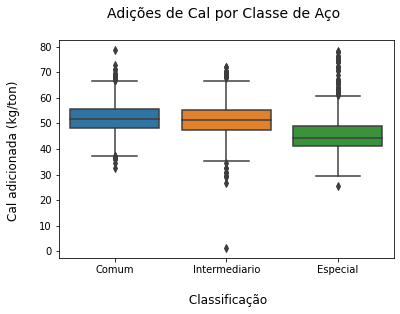

In [ ]:
sns.boxplot(x = 'Classification', y = 'Gusa Eqv.', data= FEA_1_sem_outliers_itens_analisados)
plt.ylim()
plt.title("Adições de Cal por Classe de Aço \n",fontsize = 14)
plt.xlabel("\n Classificação",fontsize = 12)
plt.ylabel("Cal adicionada (kg/ton) \n",fontsize = 12)

In [ ]:
FEA_1_sem_outliers_itens_analisados['gusa_carga'] =(FEA_1_sem_outliers_itens_analisados['GUSS (t/cor)'] / FEA_1_sem_outliers_itens_analisados['Peso Carregado (t/cor)']*100.00) 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


Text(0, 0.5, 'Gusa na carga (%) \n')

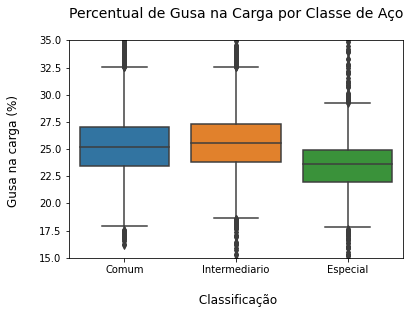

In [ ]:
sns.boxplot(x = 'Classification', y = 'gusa_carga', data= FEA_1_sem_outliers_itens_analisados)
plt.ylim([15,35])
plt.title("Percentual de Gusa na Carga por Classe de Aço\n",fontsize = 14)
plt.xlabel("\n Classificação",fontsize = 12)
plt.ylabel("Gusa na carga (%) \n",fontsize = 12)

In [ ]:
especiais_processo = FEA_1_sem_outliers_itens_analisados[FEA_1_sem_outliers_itens_analisados['Classification'] == 'Especial']
intermediario_processo = FEA_1_sem_outliers_itens_analisados[FEA_1_sem_outliers_itens_analisados['Classification'] == 'Comum']
comum_processo = FEA_1_sem_outliers_itens_analisados[FEA_1_sem_outliers_itens_analisados['Classification'] == 'Intermediario']

In [ ]:
q1_comum = comum_processo['gusa_carga'].quantile(0.25)
q3_comum = comum_processo['gusa_carga'].quantile(0.75)
Iq_comum = q3_comum - q1_comum
LI_comum = q1_comum - 1.5*Iq_comum
LS_comum = q3_comum + 1.5*Iq_comum
(round(LI_comum,2),round(LS_comum,2))

(18.61, 32.57)

In [ ]:
q1_intermediario = intermediario_processo['gusa_carga'].quantile(0.25)
q3_intermediario = intermediario_processo['gusa_carga'].quantile(0.75)
Iq_intermediario = q3_intermediario - q1_intermediario
LI_intermediario = q1_intermediario - 1.5*Iq_intermediario
LS_intermediario = q3_intermediario + 1.5*Iq_intermediario
(round(LI_intermediario,2),round(LS_intermediario,2))

(17.97, 32.54)

In [ ]:
q1_especiais = especiais_processo['gusa_carga'].quantile(0.25)
q3_especiais = especiais_processo['gusa_carga'].quantile(0.75)
Iq_especiais = q3_especiais - q1_especiais
LI_especiais = q1_especiais - 1.5*Iq_especiais
LS_especiais = q3_especiais + 1.5*Iq_especiais
(round(LI_especiais,2),round(LS_especiais,2))

(17.63, 29.23)

In [ ]:
FEA_1_sem_outliers_itens_analisados

,Aco,Turma,Consumo de Energia Elétrica (kWh/t),kg SiO2 esperada /t,kg SiO2 extra /t,Peso Carregado (t/cor),GUSS (t/cor),SHRE (t/cor),Gusa Eqv.,O2 / GUSSEQ,Densidade Teórica [t/m³],Peso Escória (kg/t),Coque Injetado [kg],Oxigênio FEA (m³/t),Gás Natural (m³/t),Pé Liquido (t) Corrigido,Coating de Panela,Temperatura de Vazamento Forno (°C),PPM O2 vazamento,Calcitica (kg) 7071955,Dolomitica (kg) 7071957,Classification,Cales_total_kg,Cal_total,Cal_total/peso,gusa_carga
0,1032,D,455.52,8.10,17.84,125.0,32.5,28.9,46.13,57.36,0.78,1.57,745,56.41,4.62,0.00,IDEAL,0,0.0,2180,1578,Comum,3758,3758.0,30.064000,26.000000
1,1032,D,332.87,8.02,0.00,120.3,31.6,28.8,48.92,49.85,0.78,0.00,654,39.20,3.18,29.25,IDEAL,0,0.0,2141,1582,Comum,3723,3723.0,30.947631,26.267664
2,1032,D,353.35,8.01,0.00,119.6,31.2,30.1,50.46,52.49,0.78,0.00,830,42.06,3.35,29.13,IDEAL,0,0.0,2080,1580,Comum,3660,3660.0,30.602007,26.086957
3,1032,D,341.92,8.14,12.75,119.7,32.4,27.4,52.00,51.41,0.77,0.85,783,39.68,2.70,28.24,IDEAL,0,812.0,1680,1578,Comum,3258,3258.0,27.218045,27.067669
4,1032,D,349.76,7.97,12.36,121.9,31.4,27.2,44.66,64.09,0.78,0.82,848,44.06,3.08,24.90,IDEAL,0,0.0,1480,1581,Comum,3061,3061.0,25.110747,25.758819
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6899,1020,C,328.54,7.81,0.00,125.5,31.1,38.2,55.41,"55,04",0.86,0.00,,52.98,4.42,25.33,IDEAL,"1.623,00",800.0,3381,1300,Especial,4681,4681.0,37.298805,24.780876
6900,1020,C,326.86,7.60,14.98,126.3,29.0,33.9,53.66,"56,67",0.88,1.42,,49.54,3.69,33.08,IDEAL,"1.617,00",885.0,3102,1300,Especial,4402,4402.0,34.853523,22.961203
6901,1020,C,327.44,7.40,0.00,123.9,28.5,22.1,45.69,"67,12",0.84,0.00,,43.55,2.45,41.41,IDEAL,"1.605,00",852.0,3079,1300,Especial,4379,4379.0,35.343019,23.002421
6902,1020,C,344.04,7.49,0.00,123.2,28.8,25.6,44.45,"73,79",0.83,0.00,,46.67,2.47,41.94,IDEAL,,0.0,3279,1299,Especial,4578,4578.0,37.159091,23.376623


Text(0, 0.5, 'Peso de escória (kg/t) \n')

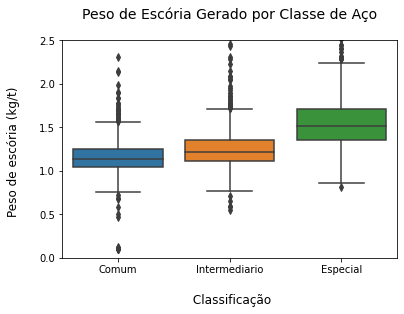

In [ ]:
sns.boxplot(x = 'Classification', y = 'Peso Escória (kg/t)', data= FEA_1_sem_outliers_itens_analisados[FEA_1_sem_outliers_itens_analisados['Peso Escória (kg/t)']!=0])
plt.ylim([0,2.5])
plt.title("Peso de Escória Gerado por Classe de Aço\n",fontsize = 14)
plt.xlabel("\n Classificação",fontsize = 12)
plt.ylabel("Peso de escória (kg/t) \n",fontsize = 12)

Text(0, 0.5, 'Oxigênio FEA (m³/t) \n')

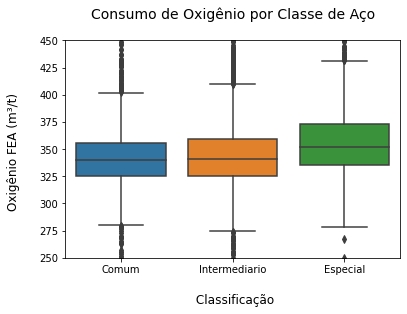

In [ ]:
sns.boxplot(x = 'Classification', y = 'Consumo de Energia Elétrica (kWh/t)', data= FEA_1_sem_outliers_itens_analisados[FEA_1_sem_outliers_itens_analisados['Consumo de Energia Elétrica (kWh/t)']!=0])
plt.ylim([250,450])
plt.title("Consumo de Oxigênio por Classe de Aço\n",fontsize = 14)
plt.xlabel("\n Classificação",fontsize = 12)
plt.ylabel("Oxigênio FEA (m³/t) \n",fontsize = 12)

In [ ]:
FEA_1_sem_outliers_itens_analisados.corr()

,Consumo de Energia Elétrica (kWh/t),kg SiO2 esperada /t,kg SiO2 extra /t,Peso Carregado (t/cor),GUSS (t/cor),SHRE (t/cor),Gusa Eqv.,Densidade Teórica [t/m³],Peso Escória (kg/t),Oxigênio FEA (m³/t),Gás Natural (m³/t),Pé Liquido (t) Corrigido,PPM O2 vazamento,Cal_total,Cal_total/peso,gusa_carga
Consumo de Energia Elétrica (kWh/t),1.000000,-0.130412,0.098807,0.234630,-0.056871,0.050980,-0.068124,-0.052121,0.118016,0.618495,0.317067,0.017075,0.079823,0.176653,0.115540,-0.128033
kg SiO2 esperada /t,-0.130412,1.000000,-0.054420,-0.169226,0.884733,-0.065238,0.592513,0.558060,-0.102272,0.047546,-0.066953,-0.012953,-0.250634,-0.237827,-0.189780,0.933619
kg SiO2 extra /t,0.098807,-0.054420,1.000000,0.068343,-0.046432,0.005880,-0.040291,-0.036670,0.945699,0.053747,0.025016,0.027520,0.093077,0.111531,0.090747,-0.068494
Peso Carregado (t/cor),0.234630,-0.169226,0.068343,1.000000,0.132561,0.179428,-0.074116,-0.097769,0.067899,0.199109,0.222442,0.080224,0.088153,0.061904,-0.254867,-0.181239
GUSS (t/cor),-0.056871,0.884733,-0.046432,0.132561,1.000000,-0.024958,0.583050,0.577950,-0.090599,0.118037,-0.004328,0.002294,-0.201043,-0.189312,-0.239633,0.947690
SHRE (t/cor),0.050980,-0.065238,0.005880,0.179428,-0.024958,1.000000,0.075104,0.035859,-0.006376,0.052531,0.117295,-0.047461,-0.056560,-0.024499,-0.073688,-0.078752
Gusa Eqv.,-0.068124,0.592513,-0.040291,-0.074116,0.583050,0.075104,1.000000,0.485104,-0.078872,0.096284,-0.077065,-0.045198,-0.029953,-0.326662,-0.289438,0.606993
Densidade Teórica [t/m³],-0.052121,0.558060,-0.036670,-0.097769,0.577950,0.035859,0.485104,1.000000,-0.043849,0.104601,-0.053189,0.085966,-0.039234,-0.021605,-0.009672,0.607444
Peso Escória (kg/t),0.118016,-0.102272,0.945699,0.067899,-0.090599,-0.006376,-0.078872,-0.043849,1.000000,0.076722,0.035841,0.046073,0.128316,0.193497,0.168071,-0.111299
Oxigênio FEA (m³/t),0.618495,0.047546,0.053747,0.199109,0.118037,0.052531,0.096284,0.104601,0.076722,1.000000,0.593409,0.032810,0.066609,0.094750,0.048252,0.056175


(15.0, 100.0)

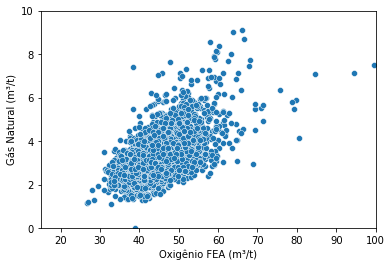

In [ ]:
sns.scatterplot(x ='Oxigênio FEA (m³/t)',y = 'Gás Natural (m³/t)',data = FEA_1_sem_outliers_itens_analisados)
plt.ylim([0,10])
plt.xlim([15,100])